In [1]:
import tensorflow as tf
import importlib
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from sklearn.utils import shuffle
import torch
import utils4
import model2
importlib.reload(utils4)
importlib.reload(model2)
from utils4 import *
from model2 import *
tf.test.is_built_with_cuda()

False

In [5]:
icon_name_category, sketch_name_category = get_icons_and_sketches()
icon_dictionary, sketch_dictionary = load_icons_sketches_dic(icon_name_category, sketch_name_category)

positive_pairs = positive_pairs_generator(icon_name_category, sketch_name_category)
positive_pairs = shuffle(positive_pairs)

len_data = len(positive_pairs)
p_train=0.9
p_test=0.1
num_train = int(np.ceil(len_data*p_train))
num_test = int(np.floor(len_data*p_test))

positive_pairs_Train = positive_pairs[:num_train]
triplet_pairs_Train = triplets_generator(positive_pairs_Train, icon_name_category)
positive_pairs_Test = positive_pairs[-num_test:]
sketches_Test = positive_pairs_Test[:, [0, 1]]

icons_Test = positive_pairs_Test[:, [2, 3]]
# create the icons test dataset by removing the dublicates of the array
_, unique_indices = np.unique(icons_Test[:,0], return_index=True)
unique_icons_Test = icons_Test[unique_indices]

print(f'We have {len(triplet_pairs_Train)} samples in the training set.')
print(f'We have {len(sketches_Test)} sketches in the test set.')
print(f'We have {len(unique_icons_Test)} unique icons in the test set.')

We have 1337 samples in the training set.
We have 148 sketches in the test set.
We have 50 unique icons in the test set.


In [3]:
BATCH_SIZE = 128
num_epochs = 100
margin = 1
optimizer = tf.keras.optimizers.Adam(0.00001)
tf.keras.backend.set_floatx('float32')
siameseModel = mynet()

loss = triplet_loss

def train_step(sketches, positive_icons, negative_icons, margin):
    with tf.GradientTape() as tape:
        sketch_features = siameseModel(sketches, training = True)
        icon_positive_features = siameseModel(positive_icons, training = True) 
        icon_negative_features = siameseModel(negative_icons, training = True)   
        tape.watch(sketch_features)
        tape.watch(icon_positive_features)
        tape.watch(icon_negative_features)
        current_loss = loss(sketch_features, icon_positive_features, icon_negative_features, margin)
    grads = tape.gradient(current_loss, siameseModel.trainable_variables)
    optimizer.apply_gradients(zip(grads, siameseModel.trainable_variables))
    return current_loss

In [7]:
BATCH_SIZE = 128
num_epochs = 100
margin = 1
optimizer = tf.keras.optimizers.Adam(0.00001)
tf.keras.backend.set_floatx('float32')
iconClassificationModel = mynet()
iconClassificationModel.load_weights('Training-Weights/iconClassification').expect_partial()
sketchClassificationModel = mynet()
sketchClassificationModel.load_weights('Training-Weights/sketchClassification').expect_partial()

loss = triplet_loss

def train_step(sketches, positive_icons, negative_icons, margin):
    with tf.GradientTape(persistent=True) as tape:
        sketch_features = sketchClassificationModel(sketches, training = True)
        icon_positive_features = iconClassificationModel(positive_icons, training = True) 
        icon_negative_features = iconClassificationModel(negative_icons, training = True)   
        tape.watch(sketch_features)
        tape.watch(icon_positive_features)
        tape.watch(icon_negative_features)
        current_loss = loss(sketch_features, icon_positive_features, icon_negative_features, margin)
    grads = tape.gradient(current_loss, sketchClassificationModel.trainable_variables)
    optimizer.apply_gradients(zip(grads, sketchClassificationModel.trainable_variables))
    grads = tape.gradient(current_loss, iconClassificationModel.trainable_variables)
    optimizer.apply_gradients(zip(grads, iconClassificationModel.trainable_variables))
    return current_loss

In [8]:
for epoch in range(num_epochs):
    epoch_loss_avg = tf.keras.metrics.Mean()
    #training_set, test_set = create_datasets(sketch_icon_indices, positive_labels, Dataset)
    #trainloader, testloader = load_dataset()
    count = 0
    for i in range(0, len(triplet_pairs_Train), BATCH_SIZE):
        batch_triple_pairs = triplet_pairs_Train[i:i+BATCH_SIZE]
        sketches, positive_icons, negative_icons = get_batch(batch_triple_pairs, icon_dictionary, sketch_dictionary)
        loss_value = train_step(sketches, positive_icons, negative_icons, margin)
        epoch_loss_avg.update_state(loss_value)
        print(count)
        count = count + 1
    print("Epoch {:d}: Loss: {:.3f}".format(epoch,epoch_loss_avg.result()))
    if epoch%1==0:
        acc_1 = 0
        acc_10 = 0
        sketch_representations = []
        for j in range(0, len(sketches_Test), BATCH_SIZE):
            batch_sketches = sketches_Test[j:j+BATCH_SIZE]
            sketches_array = get_batch_sketches(batch_sketches)
            sketch_repr =  sketchClassificationModel(sketches_array, training = False)
            sketch_representations.append(sketch_repr)
        sketch_representations = np.vstack(sketch_representations)

        icon_representations = []
        for j in range(0, len(unique_icons_Test), BATCH_SIZE):
            batch_icons = unique_icons_Test[j:j+BATCH_SIZE]
            icons_array = get_batch_icons(batch_icons)
            icons_repr =  iconClassificationModel(icons_array, training = False)
            icon_representations.append(icons_repr)
        icon_representations = np.vstack(icon_representations)

        for k in range(len(sketch_representations)):
            sketch_repr = sketch_representations[k]
            sketch_representations_tile = np.tile(sketch_repr, len(unique_icons_Test)).reshape(len(unique_icons_Test), 64)
            diff = np.sqrt(np.mean((sketch_representations_tile - icon_representations)**2, -1))
            top_k = np.argsort(diff)[:10]
            
            for j in range(len(top_k)):
                index = top_k[j]
                if j == 0 and sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                    acc_1 = acc_1 + 1
                    acc_10 = acc_10 + 1
                    break
                elif sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                    acc_10 = acc_10 + 1
                    break
        print("Accuracy of top 1: " + str(acc_1/len(sketches_Test)))
        print("Accuracy of top 10: " + str(acc_10/len(sketches_Test)))
    triplet_pairs_Train = triplets_generator(positive_pairs_Train, icon_name_category)
    triplet_pairs_Train = shuffle(triplet_pairs_Train)


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.


If you intended to run this layer in float32, you can safely ignore this warning. If in doubt, this warning is likely only an issue if you are porting a TensorFlow 1.X model to TensorFlow 2.

To change all layers to have dtype float64 by default, call `tf.keras.backend.set_floatx('float64')`. To change just this layer, pass dtype='float64' to the layer constructor. If you are the author of this layer, you can disable autocasting by passing autocast=False to the base Layer constructor.

0
1
2
3
4
5
6
7


KeyboardInterrupt: 

[[1.8403487 0.        3.8101516 ... 1.8421891 5.673955  0.       ]
 [1.8403487 0.        3.8101516 ... 1.8421891 5.673955  0.       ]
 [1.8403487 0.        3.8101516 ... 1.8421891 5.673955  0.       ]
 ...
 [1.8403487 0.        3.8101516 ... 1.8421891 5.673955  0.       ]
 [1.8403487 0.        3.8101516 ... 1.8421891 5.673955  0.       ]
 [1.8403487 0.        3.8101516 ... 1.8421891 5.673955  0.       ]]


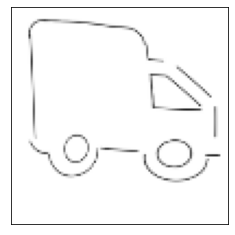

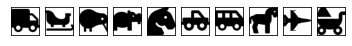

[[ 6.439415   9.030845  16.536652  ...  6.6206393  5.344802  23.550055 ]
 [ 6.439415   9.030845  16.536652  ...  6.6206393  5.344802  23.550055 ]
 [ 6.439415   9.030845  16.536652  ...  6.6206393  5.344802  23.550055 ]
 ...
 [ 6.439415   9.030845  16.536652  ...  6.6206393  5.344802  23.550055 ]
 [ 6.439415   9.030845  16.536652  ...  6.6206393  5.344802  23.550055 ]
 [ 6.439415   9.030845  16.536652  ...  6.6206393  5.344802  23.550055 ]]


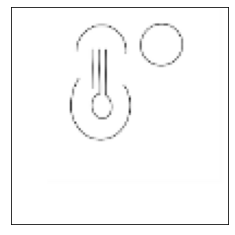

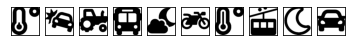

[[ 0.       21.651016  0.       ...  0.       26.58852   0.      ]
 [ 0.       21.651016  0.       ...  0.       26.58852   0.      ]
 [ 0.       21.651016  0.       ...  0.       26.58852   0.      ]
 ...
 [ 0.       21.651016  0.       ...  0.       26.58852   0.      ]
 [ 0.       21.651016  0.       ...  0.       26.58852   0.      ]
 [ 0.       21.651016  0.       ...  0.       26.58852   0.      ]]


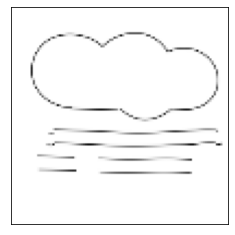

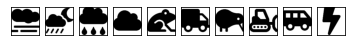

[[0.        6.360559  8.293242  ... 3.6241772 0.        8.2994585]
 [0.        6.360559  8.293242  ... 3.6241772 0.        8.2994585]
 [0.        6.360559  8.293242  ... 3.6241772 0.        8.2994585]
 ...
 [0.        6.360559  8.293242  ... 3.6241772 0.        8.2994585]
 [0.        6.360559  8.293242  ... 3.6241772 0.        8.2994585]
 [0.        6.360559  8.293242  ... 3.6241772 0.        8.2994585]]


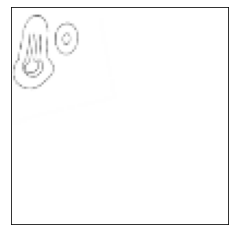

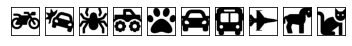

[[0.      0.      0.      ... 0.      0.      7.00559]
 [0.      0.      0.      ... 0.      0.      7.00559]
 [0.      0.      0.      ... 0.      0.      7.00559]
 ...
 [0.      0.      0.      ... 0.      0.      7.00559]
 [0.      0.      0.      ... 0.      0.      7.00559]
 [0.      0.      0.      ... 0.      0.      7.00559]]


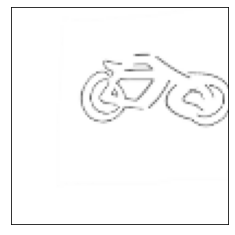

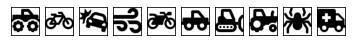

[[ 0.         5.117169  14.498099  ...  0.         4.3547955  0.       ]
 [ 0.         5.117169  14.498099  ...  0.         4.3547955  0.       ]
 [ 0.         5.117169  14.498099  ...  0.         4.3547955  0.       ]
 ...
 [ 0.         5.117169  14.498099  ...  0.         4.3547955  0.       ]
 [ 0.         5.117169  14.498099  ...  0.         4.3547955  0.       ]
 [ 0.         5.117169  14.498099  ...  0.         4.3547955  0.       ]]


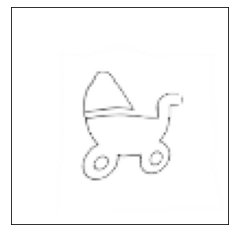

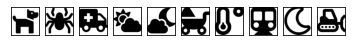

[[ 0.        13.298411  10.214237  ...  0.        14.9578     0.5130009]
 [ 0.        13.298411  10.214237  ...  0.        14.9578     0.5130009]
 [ 0.        13.298411  10.214237  ...  0.        14.9578     0.5130009]
 ...
 [ 0.        13.298411  10.214237  ...  0.        14.9578     0.5130009]
 [ 0.        13.298411  10.214237  ...  0.        14.9578     0.5130009]
 [ 0.        13.298411  10.214237  ...  0.        14.9578     0.5130009]]


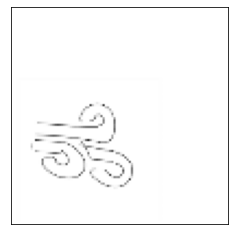

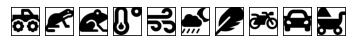

[[ 0.        2.324045 15.470665 ... 17.010954 17.794262  0.      ]
 [ 0.        2.324045 15.470665 ... 17.010954 17.794262  0.      ]
 [ 0.        2.324045 15.470665 ... 17.010954 17.794262  0.      ]
 ...
 [ 0.        2.324045 15.470665 ... 17.010954 17.794262  0.      ]
 [ 0.        2.324045 15.470665 ... 17.010954 17.794262  0.      ]
 [ 0.        2.324045 15.470665 ... 17.010954 17.794262  0.      ]]


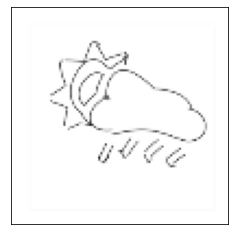

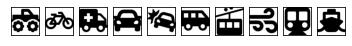

[[ 4.3711114  2.6057324  1.9194461 ...  0.        23.426388   0.       ]
 [ 4.3711114  2.6057324  1.9194461 ...  0.        23.426388   0.       ]
 [ 4.3711114  2.6057324  1.9194461 ...  0.        23.426388   0.       ]
 ...
 [ 4.3711114  2.6057324  1.9194461 ...  0.        23.426388   0.       ]
 [ 4.3711114  2.6057324  1.9194461 ...  0.        23.426388   0.       ]
 [ 4.3711114  2.6057324  1.9194461 ...  0.        23.426388   0.       ]]


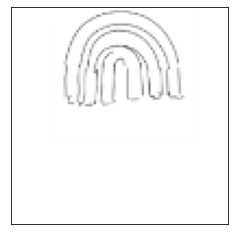

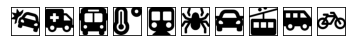

[[ 8.778184 11.253986 13.342738 ... 17.238214  8.61672  17.090435]
 [ 8.778184 11.253986 13.342738 ... 17.238214  8.61672  17.090435]
 [ 8.778184 11.253986 13.342738 ... 17.238214  8.61672  17.090435]
 ...
 [ 8.778184 11.253986 13.342738 ... 17.238214  8.61672  17.090435]
 [ 8.778184 11.253986 13.342738 ... 17.238214  8.61672  17.090435]
 [ 8.778184 11.253986 13.342738 ... 17.238214  8.61672  17.090435]]


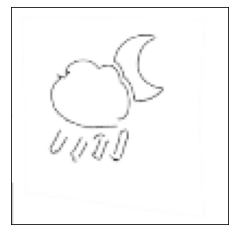

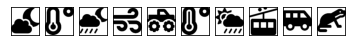

[[ 0.       15.827047 12.686392 ...  0.        0.       15.750441]
 [ 0.       15.827047 12.686392 ...  0.        0.       15.750441]
 [ 0.       15.827047 12.686392 ...  0.        0.       15.750441]
 ...
 [ 0.       15.827047 12.686392 ...  0.        0.       15.750441]
 [ 0.       15.827047 12.686392 ...  0.        0.       15.750441]
 [ 0.       15.827047 12.686392 ...  0.        0.       15.750441]]


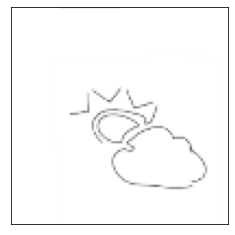

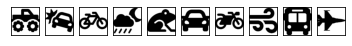

[[0.        2.9941103 0.        ... 2.982489  0.0659807 0.       ]
 [0.        2.9941103 0.        ... 2.982489  0.0659807 0.       ]
 [0.        2.9941103 0.        ... 2.982489  0.0659807 0.       ]
 ...
 [0.        2.9941103 0.        ... 2.982489  0.0659807 0.       ]
 [0.        2.9941103 0.        ... 2.982489  0.0659807 0.       ]
 [0.        2.9941103 0.        ... 2.982489  0.0659807 0.       ]]


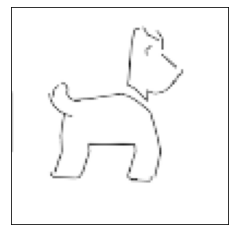

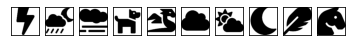

[[ 0.       17.909412  0.       ... 29.614412  0.        0.      ]
 [ 0.       17.909412  0.       ... 29.614412  0.        0.      ]
 [ 0.       17.909412  0.       ... 29.614412  0.        0.      ]
 ...
 [ 0.       17.909412  0.       ... 29.614412  0.        0.      ]
 [ 0.       17.909412  0.       ... 29.614412  0.        0.      ]
 [ 0.       17.909412  0.       ... 29.614412  0.        0.      ]]


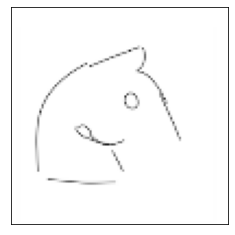

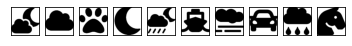

[[ 0.         0.         0.        ...  6.9640155  2.5421138 13.463088 ]
 [ 0.         0.         0.        ...  6.9640155  2.5421138 13.463088 ]
 [ 0.         0.         0.        ...  6.9640155  2.5421138 13.463088 ]
 ...
 [ 0.         0.         0.        ...  6.9640155  2.5421138 13.463088 ]
 [ 0.         0.         0.        ...  6.9640155  2.5421138 13.463088 ]
 [ 0.         0.         0.        ...  6.9640155  2.5421138 13.463088 ]]


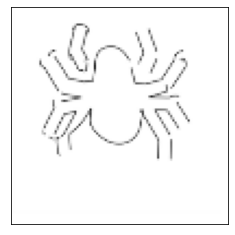

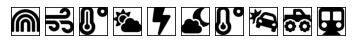

[[ 0.       10.293037  0.888347 ... 14.607061  0.        0.      ]
 [ 0.       10.293037  0.888347 ... 14.607061  0.        0.      ]
 [ 0.       10.293037  0.888347 ... 14.607061  0.        0.      ]
 ...
 [ 0.       10.293037  0.888347 ... 14.607061  0.        0.      ]
 [ 0.       10.293037  0.888347 ... 14.607061  0.        0.      ]
 [ 0.       10.293037  0.888347 ... 14.607061  0.        0.      ]]


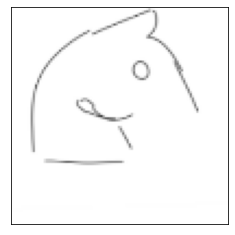

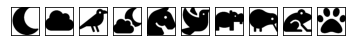

[[ 0.        18.729954   0.        ...  5.763205   0.         1.6842456]
 [ 0.        18.729954   0.        ...  5.763205   0.         1.6842456]
 [ 0.        18.729954   0.        ...  5.763205   0.         1.6842456]
 ...
 [ 0.        18.729954   0.        ...  5.763205   0.         1.6842456]
 [ 0.        18.729954   0.        ...  5.763205   0.         1.6842456]
 [ 0.        18.729954   0.        ...  5.763205   0.         1.6842456]]


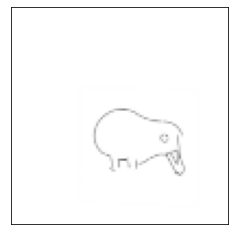

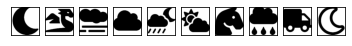

[[0.         0.         0.         ... 0.         0.11741653 0.23431489]
 [0.         0.         0.         ... 0.         0.11741653 0.23431489]
 [0.         0.         0.         ... 0.         0.11741653 0.23431489]
 ...
 [0.         0.         0.         ... 0.         0.11741653 0.23431489]
 [0.         0.         0.         ... 0.         0.11741653 0.23431489]
 [0.         0.         0.         ... 0.         0.11741653 0.23431489]]


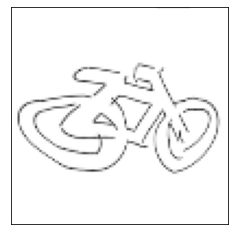

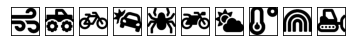

[[ 5.411976   2.1236107  0.        ...  4.9933705 20.535547  33.014217 ]
 [ 5.411976   2.1236107  0.        ...  4.9933705 20.535547  33.014217 ]
 [ 5.411976   2.1236107  0.        ...  4.9933705 20.535547  33.014217 ]
 ...
 [ 5.411976   2.1236107  0.        ...  4.9933705 20.535547  33.014217 ]
 [ 5.411976   2.1236107  0.        ...  4.9933705 20.535547  33.014217 ]
 [ 5.411976   2.1236107  0.        ...  4.9933705 20.535547  33.014217 ]]


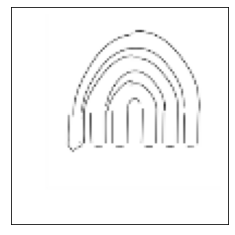

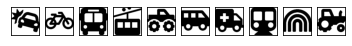

[[ 0.       17.117836  7.442989 ... 18.847324  0.        7.567005]
 [ 0.       17.117836  7.442989 ... 18.847324  0.        7.567005]
 [ 0.       17.117836  7.442989 ... 18.847324  0.        7.567005]
 ...
 [ 0.       17.117836  7.442989 ... 18.847324  0.        7.567005]
 [ 0.       17.117836  7.442989 ... 18.847324  0.        7.567005]
 [ 0.       17.117836  7.442989 ... 18.847324  0.        7.567005]]


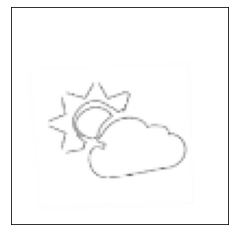

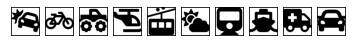

[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


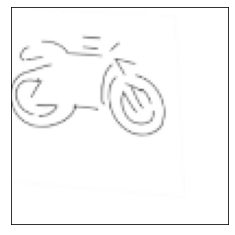

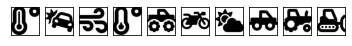

[[ 0.        9.24713  11.4954   ...  1.275907 18.717346  3.016662]
 [ 0.        9.24713  11.4954   ...  1.275907 18.717346  3.016662]
 [ 0.        9.24713  11.4954   ...  1.275907 18.717346  3.016662]
 ...
 [ 0.        9.24713  11.4954   ...  1.275907 18.717346  3.016662]
 [ 0.        9.24713  11.4954   ...  1.275907 18.717346  3.016662]
 [ 0.        9.24713  11.4954   ...  1.275907 18.717346  3.016662]]


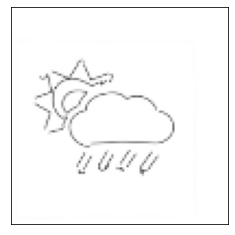

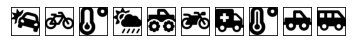

[[0.        7.7129297 5.77061   ... 6.8576245 0.        1.6076839]
 [0.        7.7129297 5.77061   ... 6.8576245 0.        1.6076839]
 [0.        7.7129297 5.77061   ... 6.8576245 0.        1.6076839]
 ...
 [0.        7.7129297 5.77061   ... 6.8576245 0.        1.6076839]
 [0.        7.7129297 5.77061   ... 6.8576245 0.        1.6076839]
 [0.        7.7129297 5.77061   ... 6.8576245 0.        1.6076839]]


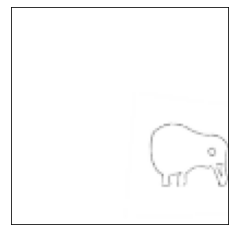

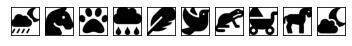

[[3.9566839  0.26703253 0.         ... 7.185386   0.         7.483686  ]
 [3.9566839  0.26703253 0.         ... 7.185386   0.         7.483686  ]
 [3.9566839  0.26703253 0.         ... 7.185386   0.         7.483686  ]
 ...
 [3.9566839  0.26703253 0.         ... 7.185386   0.         7.483686  ]
 [3.9566839  0.26703253 0.         ... 7.185386   0.         7.483686  ]
 [3.9566839  0.26703253 0.         ... 7.185386   0.         7.483686  ]]


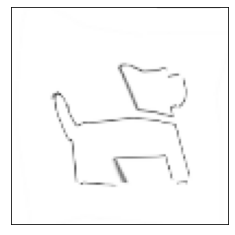

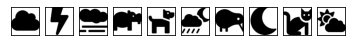

[[ 0.         15.362805    0.         ...  6.5992885   5.140442
   0.01678106]
 [ 0.         15.362805    0.         ...  6.5992885   5.140442
   0.01678106]
 [ 0.         15.362805    0.         ...  6.5992885   5.140442
   0.01678106]
 ...
 [ 0.         15.362805    0.         ...  6.5992885   5.140442
   0.01678106]
 [ 0.         15.362805    0.         ...  6.5992885   5.140442
   0.01678106]
 [ 0.         15.362805    0.         ...  6.5992885   5.140442
   0.01678106]]


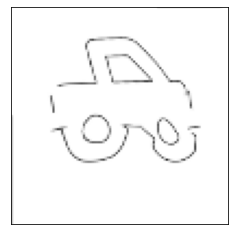

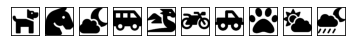

[[ 7.5231304 13.764992   0.6744827 ...  0.         8.536221   0.       ]
 [ 7.5231304 13.764992   0.6744827 ...  0.         8.536221   0.       ]
 [ 7.5231304 13.764992   0.6744827 ...  0.         8.536221   0.       ]
 ...
 [ 7.5231304 13.764992   0.6744827 ...  0.         8.536221   0.       ]
 [ 7.5231304 13.764992   0.6744827 ...  0.         8.536221   0.       ]
 [ 7.5231304 13.764992   0.6744827 ...  0.         8.536221   0.       ]]


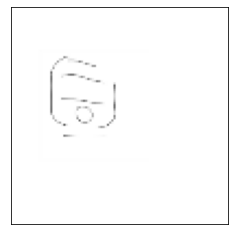

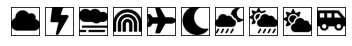

[[12.893898   0.         2.0128613 ... 14.777589   0.         0.       ]
 [12.893898   0.         2.0128613 ... 14.777589   0.         0.       ]
 [12.893898   0.         2.0128613 ... 14.777589   0.         0.       ]
 ...
 [12.893898   0.         2.0128613 ... 14.777589   0.         0.       ]
 [12.893898   0.         2.0128613 ... 14.777589   0.         0.       ]
 [12.893898   0.         2.0128613 ... 14.777589   0.         0.       ]]


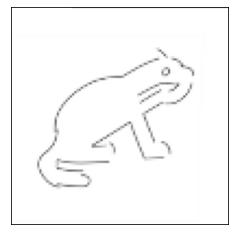

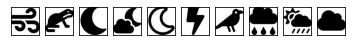

[[ 0.        11.662261  12.626129  ...  0.6492893  0.         0.       ]
 [ 0.        11.662261  12.626129  ...  0.6492893  0.         0.       ]
 [ 0.        11.662261  12.626129  ...  0.6492893  0.         0.       ]
 ...
 [ 0.        11.662261  12.626129  ...  0.6492893  0.         0.       ]
 [ 0.        11.662261  12.626129  ...  0.6492893  0.         0.       ]
 [ 0.        11.662261  12.626129  ...  0.6492893  0.         0.       ]]


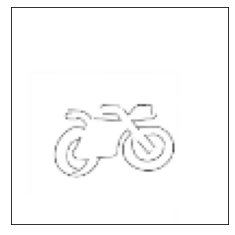

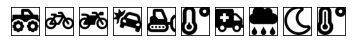

[[ 0.         3.7097666  0.        ...  0.        12.050411   0.       ]
 [ 0.         3.7097666  0.        ...  0.        12.050411   0.       ]
 [ 0.         3.7097666  0.        ...  0.        12.050411   0.       ]
 ...
 [ 0.         3.7097666  0.        ...  0.        12.050411   0.       ]
 [ 0.         3.7097666  0.        ...  0.        12.050411   0.       ]
 [ 0.         3.7097666  0.        ...  0.        12.050411   0.       ]]


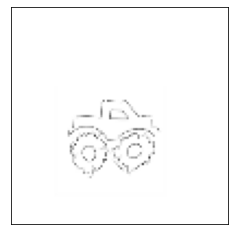

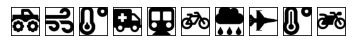

[[0.        6.5264993 0.        ... 0.        3.0609612 0.0318081]
 [0.        6.5264993 0.        ... 0.        3.0609612 0.0318081]
 [0.        6.5264993 0.        ... 0.        3.0609612 0.0318081]
 ...
 [0.        6.5264993 0.        ... 0.        3.0609612 0.0318081]
 [0.        6.5264993 0.        ... 0.        3.0609612 0.0318081]
 [0.        6.5264993 0.        ... 0.        3.0609612 0.0318081]]


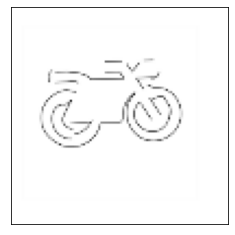

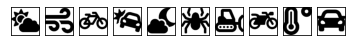

[[ 0.        13.526022   6.895279  ...  4.5068336  0.         0.       ]
 [ 0.        13.526022   6.895279  ...  4.5068336  0.         0.       ]
 [ 0.        13.526022   6.895279  ...  4.5068336  0.         0.       ]
 ...
 [ 0.        13.526022   6.895279  ...  4.5068336  0.         0.       ]
 [ 0.        13.526022   6.895279  ...  4.5068336  0.         0.       ]
 [ 0.        13.526022   6.895279  ...  4.5068336  0.         0.       ]]


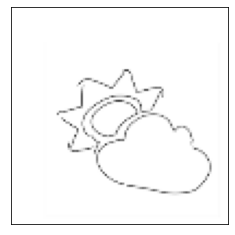

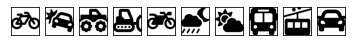

[[ 0.         5.9912205 18.475697  ...  0.         3.5825062  0.       ]
 [ 0.         5.9912205 18.475697  ...  0.         3.5825062  0.       ]
 [ 0.         5.9912205 18.475697  ...  0.         3.5825062  0.       ]
 ...
 [ 0.         5.9912205 18.475697  ...  0.         3.5825062  0.       ]
 [ 0.         5.9912205 18.475697  ...  0.         3.5825062  0.       ]
 [ 0.         5.9912205 18.475697  ...  0.         3.5825062  0.       ]]


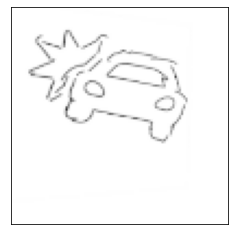

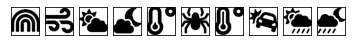

[[ 0.         0.         0.        ... 11.132592   0.         2.6984406]
 [ 0.         0.         0.        ... 11.132592   0.         2.6984406]
 [ 0.         0.         0.        ... 11.132592   0.         2.6984406]
 ...
 [ 0.         0.         0.        ... 11.132592   0.         2.6984406]
 [ 0.         0.         0.        ... 11.132592   0.         2.6984406]
 [ 0.         0.         0.        ... 11.132592   0.         2.6984406]]


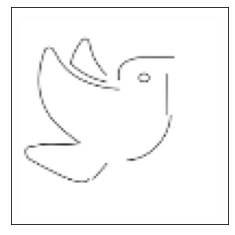

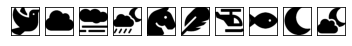

[[ 0.        16.31437    5.899705  ...  4.3848357  0.         8.203179 ]
 [ 0.        16.31437    5.899705  ...  4.3848357  0.         8.203179 ]
 [ 0.        16.31437    5.899705  ...  4.3848357  0.         8.203179 ]
 ...
 [ 0.        16.31437    5.899705  ...  4.3848357  0.         8.203179 ]
 [ 0.        16.31437    5.899705  ...  4.3848357  0.         8.203179 ]
 [ 0.        16.31437    5.899705  ...  4.3848357  0.         8.203179 ]]


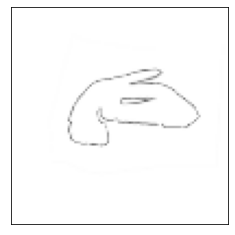

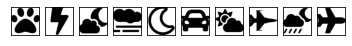

[[7.1105714 0.        0.        ... 0.        4.6626654 0.       ]
 [7.1105714 0.        0.        ... 0.        4.6626654 0.       ]
 [7.1105714 0.        0.        ... 0.        4.6626654 0.       ]
 ...
 [7.1105714 0.        0.        ... 0.        4.6626654 0.       ]
 [7.1105714 0.        0.        ... 0.        4.6626654 0.       ]
 [7.1105714 0.        0.        ... 0.        4.6626654 0.       ]]


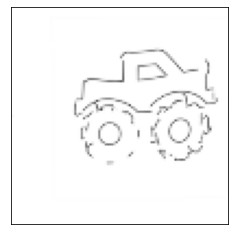

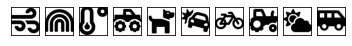

[[ 2.5561378 14.244593   3.5022619 ... 11.880353   0.        18.686407 ]
 [ 2.5561378 14.244593   3.5022619 ... 11.880353   0.        18.686407 ]
 [ 2.5561378 14.244593   3.5022619 ... 11.880353   0.        18.686407 ]
 ...
 [ 2.5561378 14.244593   3.5022619 ... 11.880353   0.        18.686407 ]
 [ 2.5561378 14.244593   3.5022619 ... 11.880353   0.        18.686407 ]
 [ 2.5561378 14.244593   3.5022619 ... 11.880353   0.        18.686407 ]]


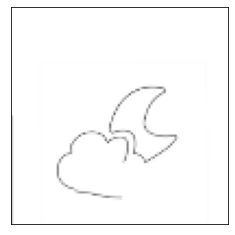

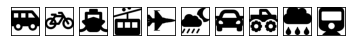

[[1.7536321  6.2801394  4.6762395  ... 0.         0.         0.41498348]
 [1.7536321  6.2801394  4.6762395  ... 0.         0.         0.41498348]
 [1.7536321  6.2801394  4.6762395  ... 0.         0.         0.41498348]
 ...
 [1.7536321  6.2801394  4.6762395  ... 0.         0.         0.41498348]
 [1.7536321  6.2801394  4.6762395  ... 0.         0.         0.41498348]
 [1.7536321  6.2801394  4.6762395  ... 0.         0.         0.41498348]]


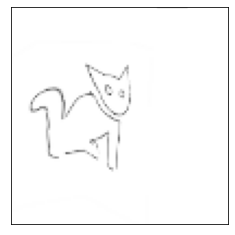

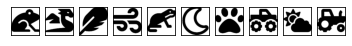

[[18.057037  0.        9.536257 ...  0.       17.421976  0.      ]
 [18.057037  0.        9.536257 ...  0.       17.421976  0.      ]
 [18.057037  0.        9.536257 ...  0.       17.421976  0.      ]
 ...
 [18.057037  0.        9.536257 ...  0.       17.421976  0.      ]
 [18.057037  0.        9.536257 ...  0.       17.421976  0.      ]
 [18.057037  0.        9.536257 ...  0.       17.421976  0.      ]]


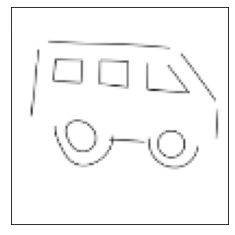

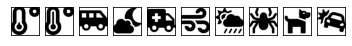

[[ 0.        11.189777   3.9820137 ...  2.5322783  0.         7.0702944]
 [ 0.        11.189777   3.9820137 ...  2.5322783  0.         7.0702944]
 [ 0.        11.189777   3.9820137 ...  2.5322783  0.         7.0702944]
 ...
 [ 0.        11.189777   3.9820137 ...  2.5322783  0.         7.0702944]
 [ 0.        11.189777   3.9820137 ...  2.5322783  0.         7.0702944]
 [ 0.        11.189777   3.9820137 ...  2.5322783  0.         7.0702944]]


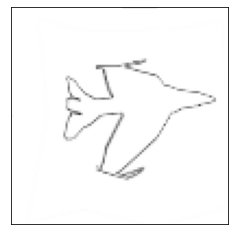

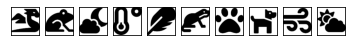

[[ 0.         4.5359845  7.8139963 ... 25.453957   0.         0.       ]
 [ 0.         4.5359845  7.8139963 ... 25.453957   0.         0.       ]
 [ 0.         4.5359845  7.8139963 ... 25.453957   0.         0.       ]
 ...
 [ 0.         4.5359845  7.8139963 ... 25.453957   0.         0.       ]
 [ 0.         4.5359845  7.8139963 ... 25.453957   0.         0.       ]
 [ 0.         4.5359845  7.8139963 ... 25.453957   0.         0.       ]]


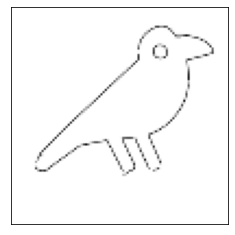

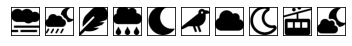

[[ 0.         8.55331    0.        ...  6.3110137 26.332123  25.945776 ]
 [ 0.         8.55331    0.        ...  6.3110137 26.332123  25.945776 ]
 [ 0.         8.55331    0.        ...  6.3110137 26.332123  25.945776 ]
 ...
 [ 0.         8.55331    0.        ...  6.3110137 26.332123  25.945776 ]
 [ 0.         8.55331    0.        ...  6.3110137 26.332123  25.945776 ]
 [ 0.         8.55331    0.        ...  6.3110137 26.332123  25.945776 ]]


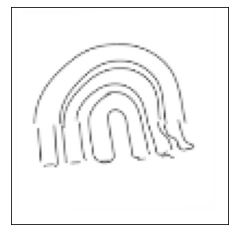

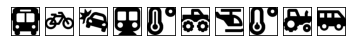

[[ 0.         0.         5.3487554 ... 24.298222   0.         0.       ]
 [ 0.         0.         5.3487554 ... 24.298222   0.         0.       ]
 [ 0.         0.         5.3487554 ... 24.298222   0.         0.       ]
 ...
 [ 0.         0.         5.3487554 ... 24.298222   0.         0.       ]
 [ 0.         0.         5.3487554 ... 24.298222   0.         0.       ]
 [ 0.         0.         5.3487554 ... 24.298222   0.         0.       ]]


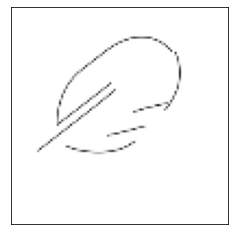

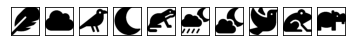

[[1.2457256 0.        0.3432027 ... 0.        3.2199137 0.       ]
 [1.2457256 0.        0.3432027 ... 0.        3.2199137 0.       ]
 [1.2457256 0.        0.3432027 ... 0.        3.2199137 0.       ]
 ...
 [1.2457256 0.        0.3432027 ... 0.        3.2199137 0.       ]
 [1.2457256 0.        0.3432027 ... 0.        3.2199137 0.       ]
 [1.2457256 0.        0.3432027 ... 0.        3.2199137 0.       ]]


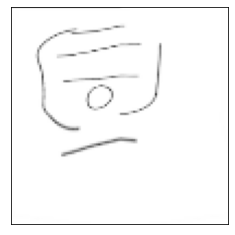

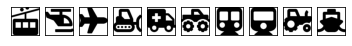

[[0.        7.0161285 0.        ... 0.892095  6.480776  5.0153537]
 [0.        7.0161285 0.        ... 0.892095  6.480776  5.0153537]
 [0.        7.0161285 0.        ... 0.892095  6.480776  5.0153537]
 ...
 [0.        7.0161285 0.        ... 0.892095  6.480776  5.0153537]
 [0.        7.0161285 0.        ... 0.892095  6.480776  5.0153537]
 [0.        7.0161285 0.        ... 0.892095  6.480776  5.0153537]]


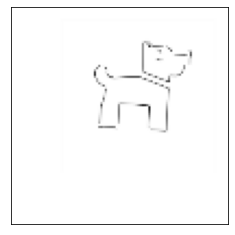

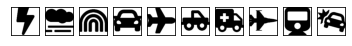

[[10.689637 13.585536 19.354454 ...  0.       32.45612  27.879818]
 [10.689637 13.585536 19.354454 ...  0.       32.45612  27.879818]
 [10.689637 13.585536 19.354454 ...  0.       32.45612  27.879818]
 ...
 [10.689637 13.585536 19.354454 ...  0.       32.45612  27.879818]
 [10.689637 13.585536 19.354454 ...  0.       32.45612  27.879818]
 [10.689637 13.585536 19.354454 ...  0.       32.45612  27.879818]]


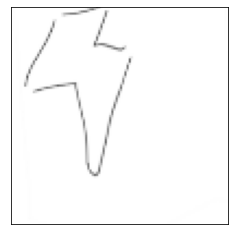

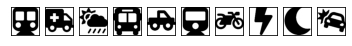

[[3.3910277 2.6951115 5.360902  ... 0.        0.        0.       ]
 [3.3910277 2.6951115 5.360902  ... 0.        0.        0.       ]
 [3.3910277 2.6951115 5.360902  ... 0.        0.        0.       ]
 ...
 [3.3910277 2.6951115 5.360902  ... 0.        0.        0.       ]
 [3.3910277 2.6951115 5.360902  ... 0.        0.        0.       ]
 [3.3910277 2.6951115 5.360902  ... 0.        0.        0.       ]]


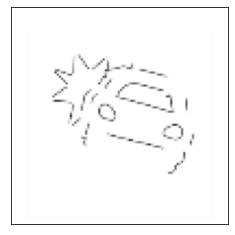

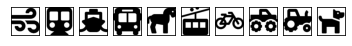

[[3.1869376  0.89728487 3.351303   ... 0.         4.9334126  0.        ]
 [3.1869376  0.89728487 3.351303   ... 0.         4.9334126  0.        ]
 [3.1869376  0.89728487 3.351303   ... 0.         4.9334126  0.        ]
 ...
 [3.1869376  0.89728487 3.351303   ... 0.         4.9334126  0.        ]
 [3.1869376  0.89728487 3.351303   ... 0.         4.9334126  0.        ]
 [3.1869376  0.89728487 3.351303   ... 0.         4.9334126  0.        ]]


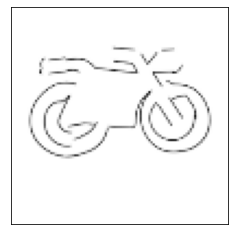

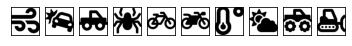

[[ 0.        18.49981    1.0077683 ...  0.6750435  0.         6.662417 ]
 [ 0.        18.49981    1.0077683 ...  0.6750435  0.         6.662417 ]
 [ 0.        18.49981    1.0077683 ...  0.6750435  0.         6.662417 ]
 ...
 [ 0.        18.49981    1.0077683 ...  0.6750435  0.         6.662417 ]
 [ 0.        18.49981    1.0077683 ...  0.6750435  0.         6.662417 ]
 [ 0.        18.49981    1.0077683 ...  0.6750435  0.         6.662417 ]]


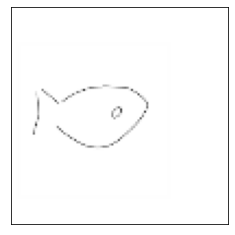

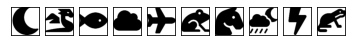

[[ 0.       11.016431  0.       ... 21.295502  0.        0.      ]
 [ 0.       11.016431  0.       ... 21.295502  0.        0.      ]
 [ 0.       11.016431  0.       ... 21.295502  0.        0.      ]
 ...
 [ 0.       11.016431  0.       ... 21.295502  0.        0.      ]
 [ 0.       11.016431  0.       ... 21.295502  0.        0.      ]
 [ 0.       11.016431  0.       ... 21.295502  0.        0.      ]]


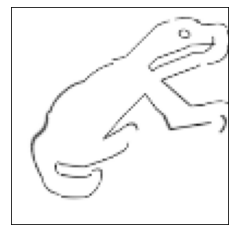

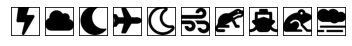

[[ 0.        5.42961  10.655964 ...  0.        0.        0.      ]
 [ 0.        5.42961  10.655964 ...  0.        0.        0.      ]
 [ 0.        5.42961  10.655964 ...  0.        0.        0.      ]
 ...
 [ 0.        5.42961  10.655964 ...  0.        0.        0.      ]
 [ 0.        5.42961  10.655964 ...  0.        0.        0.      ]
 [ 0.        5.42961  10.655964 ...  0.        0.        0.      ]]


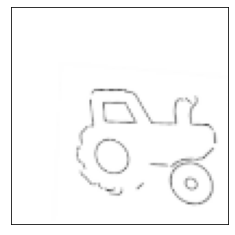

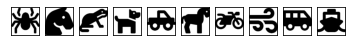

[[ 2.1303601 13.234469   0.        ... 19.996925   0.         0.       ]
 [ 2.1303601 13.234469   0.        ... 19.996925   0.         0.       ]
 [ 2.1303601 13.234469   0.        ... 19.996925   0.         0.       ]
 ...
 [ 2.1303601 13.234469   0.        ... 19.996925   0.         0.       ]
 [ 2.1303601 13.234469   0.        ... 19.996925   0.         0.       ]
 [ 2.1303601 13.234469   0.        ... 19.996925   0.         0.       ]]


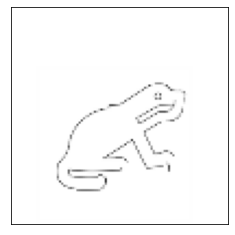

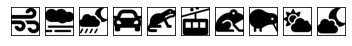

[[0.        0.        5.7366147 ... 3.470906  0.        4.5580797]
 [0.        0.        5.7366147 ... 3.470906  0.        4.5580797]
 [0.        0.        5.7366147 ... 3.470906  0.        4.5580797]
 ...
 [0.        0.        5.7366147 ... 3.470906  0.        4.5580797]
 [0.        0.        5.7366147 ... 3.470906  0.        4.5580797]
 [0.        0.        5.7366147 ... 3.470906  0.        4.5580797]]


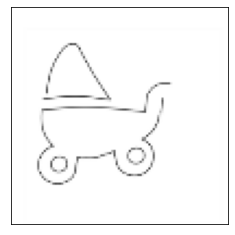

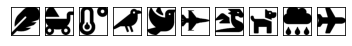

[[0.        9.27549   4.8874607 ... 4.020665  0.        4.6556787]
 [0.        9.27549   4.8874607 ... 4.020665  0.        4.6556787]
 [0.        9.27549   4.8874607 ... 4.020665  0.        4.6556787]
 ...
 [0.        9.27549   4.8874607 ... 4.020665  0.        4.6556787]
 [0.        9.27549   4.8874607 ... 4.020665  0.        4.6556787]
 [0.        9.27549   4.8874607 ... 4.020665  0.        4.6556787]]


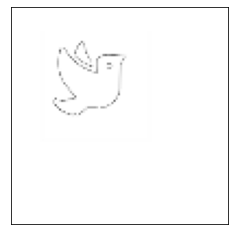

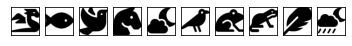

[[1.3913672 2.8908179 7.836988  ... 5.0147395 2.2190602 7.459974 ]
 [1.3913672 2.8908179 7.836988  ... 5.0147395 2.2190602 7.459974 ]
 [1.3913672 2.8908179 7.836988  ... 5.0147395 2.2190602 7.459974 ]
 ...
 [1.3913672 2.8908179 7.836988  ... 5.0147395 2.2190602 7.459974 ]
 [1.3913672 2.8908179 7.836988  ... 5.0147395 2.2190602 7.459974 ]
 [1.3913672 2.8908179 7.836988  ... 5.0147395 2.2190602 7.459974 ]]


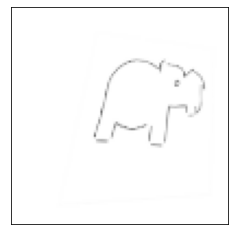

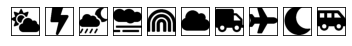

[[7.1110487 0.        9.357198  ... 5.575582  0.        0.       ]
 [7.1110487 0.        9.357198  ... 5.575582  0.        0.       ]
 [7.1110487 0.        9.357198  ... 5.575582  0.        0.       ]
 ...
 [7.1110487 0.        9.357198  ... 5.575582  0.        0.       ]
 [7.1110487 0.        9.357198  ... 5.575582  0.        0.       ]
 [7.1110487 0.        9.357198  ... 5.575582  0.        0.       ]]


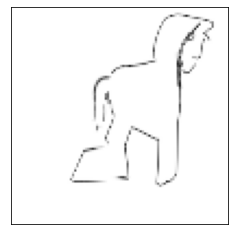

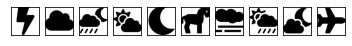

[[ 0.       13.552909 12.567814 ...  0.        0.        0.      ]
 [ 0.       13.552909 12.567814 ...  0.        0.        0.      ]
 [ 0.       13.552909 12.567814 ...  0.        0.        0.      ]
 ...
 [ 0.       13.552909 12.567814 ...  0.        0.        0.      ]
 [ 0.       13.552909 12.567814 ...  0.        0.        0.      ]
 [ 0.       13.552909 12.567814 ...  0.        0.        0.      ]]


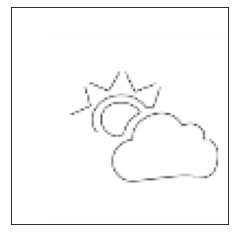

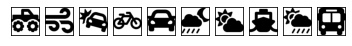

[[2.949924  6.1103077 7.3706436 ... 9.229814  0.        6.877051 ]
 [2.949924  6.1103077 7.3706436 ... 9.229814  0.        6.877051 ]
 [2.949924  6.1103077 7.3706436 ... 9.229814  0.        6.877051 ]
 ...
 [2.949924  6.1103077 7.3706436 ... 9.229814  0.        6.877051 ]
 [2.949924  6.1103077 7.3706436 ... 9.229814  0.        6.877051 ]
 [2.949924  6.1103077 7.3706436 ... 9.229814  0.        6.877051 ]]


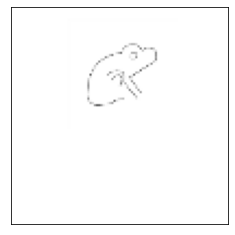

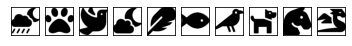

[[ 0.         4.992178   3.4273329 ...  9.4869795  0.        10.389019 ]
 [ 0.         4.992178   3.4273329 ...  9.4869795  0.        10.389019 ]
 [ 0.         4.992178   3.4273329 ...  9.4869795  0.        10.389019 ]
 ...
 [ 0.         4.992178   3.4273329 ...  9.4869795  0.        10.389019 ]
 [ 0.         4.992178   3.4273329 ...  9.4869795  0.        10.389019 ]
 [ 0.         4.992178   3.4273329 ...  9.4869795  0.        10.389019 ]]


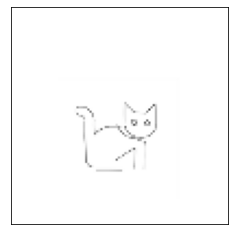

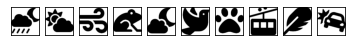

[[ 0.        19.728      9.473717  ...  0.         6.7240553  0.       ]
 [ 0.        19.728      9.473717  ...  0.         6.7240553  0.       ]
 [ 0.        19.728      9.473717  ...  0.         6.7240553  0.       ]
 ...
 [ 0.        19.728      9.473717  ...  0.         6.7240553  0.       ]
 [ 0.        19.728      9.473717  ...  0.         6.7240553  0.       ]
 [ 0.        19.728      9.473717  ...  0.         6.7240553  0.       ]]


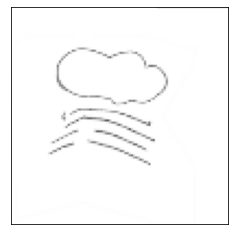

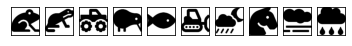

[[ 0.         3.6983457 13.712525  ...  3.4824555  7.1917243 13.795631 ]
 [ 0.         3.6983457 13.712525  ...  3.4824555  7.1917243 13.795631 ]
 [ 0.         3.6983457 13.712525  ...  3.4824555  7.1917243 13.795631 ]
 ...
 [ 0.         3.6983457 13.712525  ...  3.4824555  7.1917243 13.795631 ]
 [ 0.         3.6983457 13.712525  ...  3.4824555  7.1917243 13.795631 ]
 [ 0.         3.6983457 13.712525  ...  3.4824555  7.1917243 13.795631 ]]


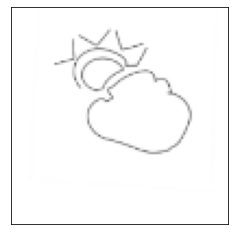

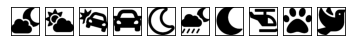

[[8.505326   0.27402627 3.2544136  ... 0.         8.641382   6.947466  ]
 [8.505326   0.27402627 3.2544136  ... 0.         8.641382   6.947466  ]
 [8.505326   0.27402627 3.2544136  ... 0.         8.641382   6.947466  ]
 ...
 [8.505326   0.27402627 3.2544136  ... 0.         8.641382   6.947466  ]
 [8.505326   0.27402627 3.2544136  ... 0.         8.641382   6.947466  ]
 [8.505326   0.27402627 3.2544136  ... 0.         8.641382   6.947466  ]]


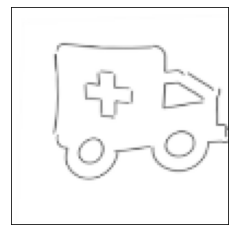

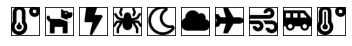

[[ 0.        15.041984   0.        ... 15.435269   0.        10.7740755]
 [ 0.        15.041984   0.        ... 15.435269   0.        10.7740755]
 [ 0.        15.041984   0.        ... 15.435269   0.        10.7740755]
 ...
 [ 0.        15.041984   0.        ... 15.435269   0.        10.7740755]
 [ 0.        15.041984   0.        ... 15.435269   0.        10.7740755]
 [ 0.        15.041984   0.        ... 15.435269   0.        10.7740755]]


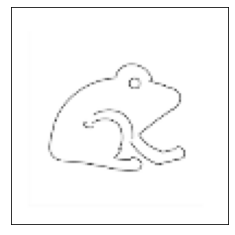

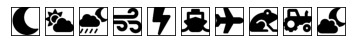

[[ 0.         10.29919    10.065486   ...  4.5847178   0.40615812
   2.4343147 ]
 [ 0.         10.29919    10.065486   ...  4.5847178   0.40615812
   2.4343147 ]
 [ 0.         10.29919    10.065486   ...  4.5847178   0.40615812
   2.4343147 ]
 ...
 [ 0.         10.29919    10.065486   ...  4.5847178   0.40615812
   2.4343147 ]
 [ 0.         10.29919    10.065486   ...  4.5847178   0.40615812
   2.4343147 ]
 [ 0.         10.29919    10.065486   ...  4.5847178   0.40615812
   2.4343147 ]]


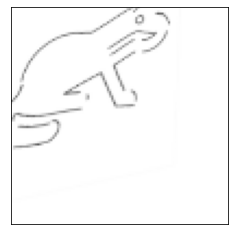

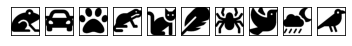

[[ 0.          0.          2.0310478  ...  0.39269063 16.842237
  19.279936  ]
 [ 0.          0.          2.0310478  ...  0.39269063 16.842237
  19.279936  ]
 [ 0.          0.          2.0310478  ...  0.39269063 16.842237
  19.279936  ]
 ...
 [ 0.          0.          2.0310478  ...  0.39269063 16.842237
  19.279936  ]
 [ 0.          0.          2.0310478  ...  0.39269063 16.842237
  19.279936  ]
 [ 0.          0.          2.0310478  ...  0.39269063 16.842237
  19.279936  ]]


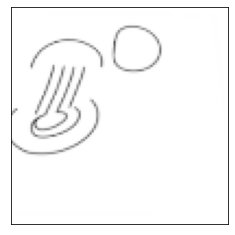

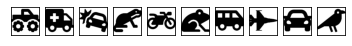

[[ 0.        12.517877   0.        ...  3.5406258  4.4322953  3.675161 ]
 [ 0.        12.517877   0.        ...  3.5406258  4.4322953  3.675161 ]
 [ 0.        12.517877   0.        ...  3.5406258  4.4322953  3.675161 ]
 ...
 [ 0.        12.517877   0.        ...  3.5406258  4.4322953  3.675161 ]
 [ 0.        12.517877   0.        ...  3.5406258  4.4322953  3.675161 ]
 [ 0.        12.517877   0.        ...  3.5406258  4.4322953  3.675161 ]]


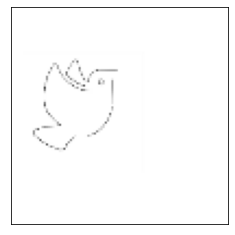

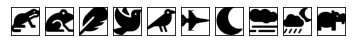

[[ 5.818244  19.20457    0.9679929 ... 15.284479   0.         2.0964565]
 [ 5.818244  19.20457    0.9679929 ... 15.284479   0.         2.0964565]
 [ 5.818244  19.20457    0.9679929 ... 15.284479   0.         2.0964565]
 ...
 [ 5.818244  19.20457    0.9679929 ... 15.284479   0.         2.0964565]
 [ 5.818244  19.20457    0.9679929 ... 15.284479   0.         2.0964565]
 [ 5.818244  19.20457    0.9679929 ... 15.284479   0.         2.0964565]]


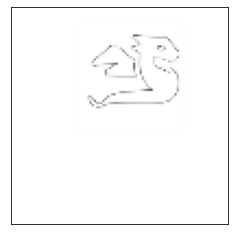

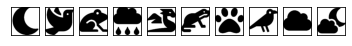

[[0.         4.3604627  0.54666936 ... 0.         6.6961384  0.        ]
 [0.         4.3604627  0.54666936 ... 0.         6.6961384  0.        ]
 [0.         4.3604627  0.54666936 ... 0.         6.6961384  0.        ]
 ...
 [0.         4.3604627  0.54666936 ... 0.         6.6961384  0.        ]
 [0.         4.3604627  0.54666936 ... 0.         6.6961384  0.        ]
 [0.         4.3604627  0.54666936 ... 0.         6.6961384  0.        ]]


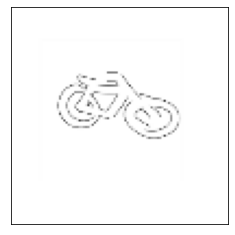

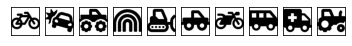

[[ 0.33898652 19.319721   15.322346   ... 14.978435    0.
   5.665571  ]
 [ 0.33898652 19.319721   15.322346   ... 14.978435    0.
   5.665571  ]
 [ 0.33898652 19.319721   15.322346   ... 14.978435    0.
   5.665571  ]
 ...
 [ 0.33898652 19.319721   15.322346   ... 14.978435    0.
   5.665571  ]
 [ 0.33898652 19.319721   15.322346   ... 14.978435    0.
   5.665571  ]
 [ 0.33898652 19.319721   15.322346   ... 14.978435    0.
   5.665571  ]]


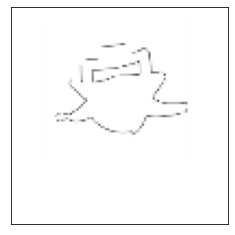

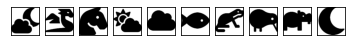

[[ 0.         9.358661  11.0663185 ...  0.         0.         2.6825566]
 [ 0.         9.358661  11.0663185 ...  0.         0.         2.6825566]
 [ 0.         9.358661  11.0663185 ...  0.         0.         2.6825566]
 ...
 [ 0.         9.358661  11.0663185 ...  0.         0.         2.6825566]
 [ 0.         9.358661  11.0663185 ...  0.         0.         2.6825566]
 [ 0.         9.358661  11.0663185 ...  0.         0.         2.6825566]]


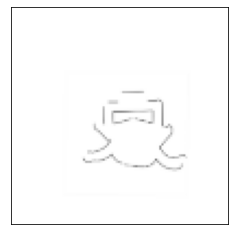

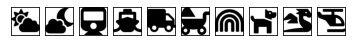

[[ 0.       14.007247 20.347818 ...  0.        0.       13.984666]
 [ 0.       14.007247 20.347818 ...  0.        0.       13.984666]
 [ 0.       14.007247 20.347818 ...  0.        0.       13.984666]
 ...
 [ 0.       14.007247 20.347818 ...  0.        0.       13.984666]
 [ 0.       14.007247 20.347818 ...  0.        0.       13.984666]
 [ 0.       14.007247 20.347818 ...  0.        0.       13.984666]]


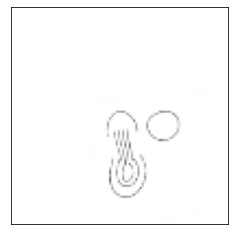

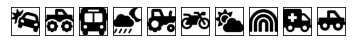

[[ 0.         4.4762306  9.547047  ... 16.890596   0.3425924  8.236788 ]
 [ 0.         4.4762306  9.547047  ... 16.890596   0.3425924  8.236788 ]
 [ 0.         4.4762306  9.547047  ... 16.890596   0.3425924  8.236788 ]
 ...
 [ 0.         4.4762306  9.547047  ... 16.890596   0.3425924  8.236788 ]
 [ 0.         4.4762306  9.547047  ... 16.890596   0.3425924  8.236788 ]
 [ 0.         4.4762306  9.547047  ... 16.890596   0.3425924  8.236788 ]]


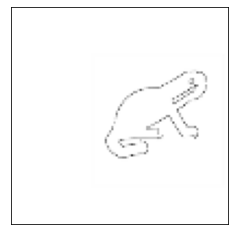

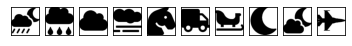

[[ 0.         2.3083966 16.884766  ...  8.212985  11.949094  15.946192 ]
 [ 0.         2.3083966 16.884766  ...  8.212985  11.949094  15.946192 ]
 [ 0.         2.3083966 16.884766  ...  8.212985  11.949094  15.946192 ]
 ...
 [ 0.         2.3083966 16.884766  ...  8.212985  11.949094  15.946192 ]
 [ 0.         2.3083966 16.884766  ...  8.212985  11.949094  15.946192 ]
 [ 0.         2.3083966 16.884766  ...  8.212985  11.949094  15.946192 ]]


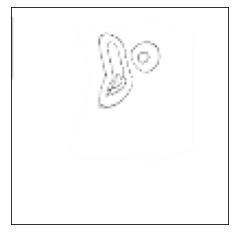

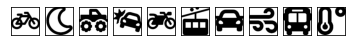

[[ 0.         4.5180383  3.6273508 ...  3.3111253  0.        10.293659 ]
 [ 0.         4.5180383  3.6273508 ...  3.3111253  0.        10.293659 ]
 [ 0.         4.5180383  3.6273508 ...  3.3111253  0.        10.293659 ]
 ...
 [ 0.         4.5180383  3.6273508 ...  3.3111253  0.        10.293659 ]
 [ 0.         4.5180383  3.6273508 ...  3.3111253  0.        10.293659 ]
 [ 0.         4.5180383  3.6273508 ...  3.3111253  0.        10.293659 ]]


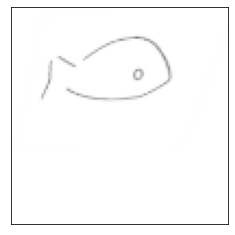

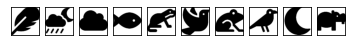

[[ 0.        19.561491   2.789752  ...  2.6605976  0.         2.944271 ]
 [ 0.        19.561491   2.789752  ...  2.6605976  0.         2.944271 ]
 [ 0.        19.561491   2.789752  ...  2.6605976  0.         2.944271 ]
 ...
 [ 0.        19.561491   2.789752  ...  2.6605976  0.         2.944271 ]
 [ 0.        19.561491   2.789752  ...  2.6605976  0.         2.944271 ]
 [ 0.        19.561491   2.789752  ...  2.6605976  0.         2.944271 ]]


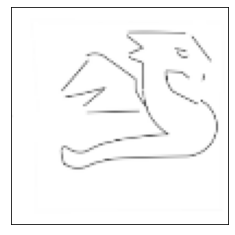

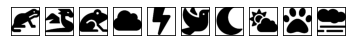

[[ 5.2677155 14.369769   0.        ...  4.0197024 16.798258  20.971655 ]
 [ 5.2677155 14.369769   0.        ...  4.0197024 16.798258  20.971655 ]
 [ 5.2677155 14.369769   0.        ...  4.0197024 16.798258  20.971655 ]
 ...
 [ 5.2677155 14.369769   0.        ...  4.0197024 16.798258  20.971655 ]
 [ 5.2677155 14.369769   0.        ...  4.0197024 16.798258  20.971655 ]
 [ 5.2677155 14.369769   0.        ...  4.0197024 16.798258  20.971655 ]]


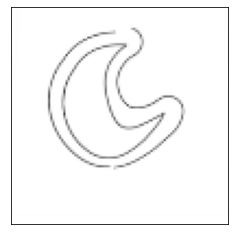

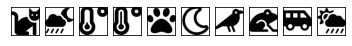

[[ 0.       18.62796   8.749049 ... 21.844236  3.003966 21.425722]
 [ 0.       18.62796   8.749049 ... 21.844236  3.003966 21.425722]
 [ 0.       18.62796   8.749049 ... 21.844236  3.003966 21.425722]
 ...
 [ 0.       18.62796   8.749049 ... 21.844236  3.003966 21.425722]
 [ 0.       18.62796   8.749049 ... 21.844236  3.003966 21.425722]
 [ 0.       18.62796   8.749049 ... 21.844236  3.003966 21.425722]]


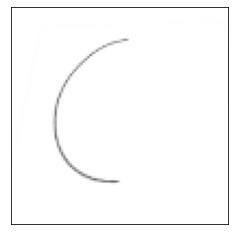

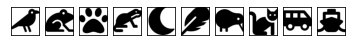

[[ 0.       11.145169 10.309807 ...  0.        0.        9.252632]
 [ 0.       11.145169 10.309807 ...  0.        0.        9.252632]
 [ 0.       11.145169 10.309807 ...  0.        0.        9.252632]
 ...
 [ 0.       11.145169 10.309807 ...  0.        0.        9.252632]
 [ 0.       11.145169 10.309807 ...  0.        0.        9.252632]
 [ 0.       11.145169 10.309807 ...  0.        0.        9.252632]]


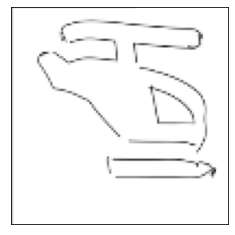

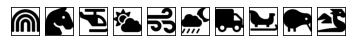

[[ 0.         8.98017   11.191917  ...  0.3593987  2.4503896  7.2588067]
 [ 0.         8.98017   11.191917  ...  0.3593987  2.4503896  7.2588067]
 [ 0.         8.98017   11.191917  ...  0.3593987  2.4503896  7.2588067]
 ...
 [ 0.         8.98017   11.191917  ...  0.3593987  2.4503896  7.2588067]
 [ 0.         8.98017   11.191917  ...  0.3593987  2.4503896  7.2588067]
 [ 0.         8.98017   11.191917  ...  0.3593987  2.4503896  7.2588067]]


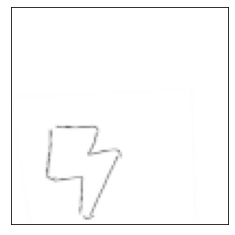

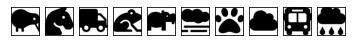

[[ 4.3832765 13.155757   1.4263426 ... 21.918747   2.1894221  7.5723276]
 [ 4.3832765 13.155757   1.4263426 ... 21.918747   2.1894221  7.5723276]
 [ 4.3832765 13.155757   1.4263426 ... 21.918747   2.1894221  7.5723276]
 ...
 [ 4.3832765 13.155757   1.4263426 ... 21.918747   2.1894221  7.5723276]
 [ 4.3832765 13.155757   1.4263426 ... 21.918747   2.1894221  7.5723276]
 [ 4.3832765 13.155757   1.4263426 ... 21.918747   2.1894221  7.5723276]]


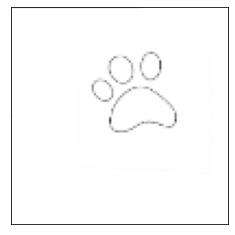

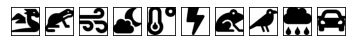

[[0.96695757 3.4000669  9.229106   ... 0.         4.4178457  0.        ]
 [0.96695757 3.4000669  9.229106   ... 0.         4.4178457  0.        ]
 [0.96695757 3.4000669  9.229106   ... 0.         4.4178457  0.        ]
 ...
 [0.96695757 3.4000669  9.229106   ... 0.         4.4178457  0.        ]
 [0.96695757 3.4000669  9.229106   ... 0.         4.4178457  0.        ]
 [0.96695757 3.4000669  9.229106   ... 0.         4.4178457  0.        ]]


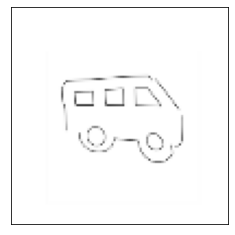

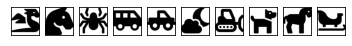

[[0.        9.984199  0.3797841 ... 0.        6.7970357 0.       ]
 [0.        9.984199  0.3797841 ... 0.        6.7970357 0.       ]
 [0.        9.984199  0.3797841 ... 0.        6.7970357 0.       ]
 ...
 [0.        9.984199  0.3797841 ... 0.        6.7970357 0.       ]
 [0.        9.984199  0.3797841 ... 0.        6.7970357 0.       ]
 [0.        9.984199  0.3797841 ... 0.        6.7970357 0.       ]]


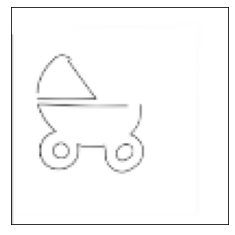

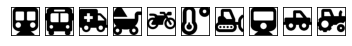

[[ 0.         7.8455744  9.04644   ... 32.461594   0.        24.026167 ]
 [ 0.         7.8455744  9.04644   ... 32.461594   0.        24.026167 ]
 [ 0.         7.8455744  9.04644   ... 32.461594   0.        24.026167 ]
 ...
 [ 0.         7.8455744  9.04644   ... 32.461594   0.        24.026167 ]
 [ 0.         7.8455744  9.04644   ... 32.461594   0.        24.026167 ]
 [ 0.         7.8455744  9.04644   ... 32.461594   0.        24.026167 ]]


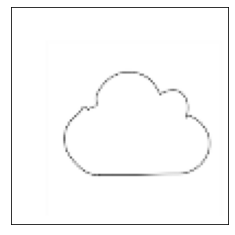

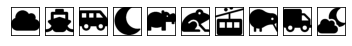

[[ 0.         3.3929026 24.236618  ...  0.         0.         7.126494 ]
 [ 0.         3.3929026 24.236618  ...  0.         0.         7.126494 ]
 [ 0.         3.3929026 24.236618  ...  0.         0.         7.126494 ]
 ...
 [ 0.         3.3929026 24.236618  ...  0.         0.         7.126494 ]
 [ 0.         3.3929026 24.236618  ...  0.         0.         7.126494 ]
 [ 0.         3.3929026 24.236618  ...  0.         0.         7.126494 ]]


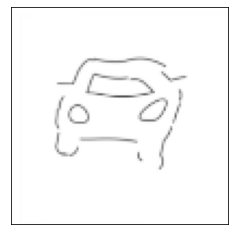

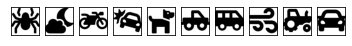

[[ 0.        0.       13.061247 ...  0.       22.56308   0.      ]
 [ 0.        0.       13.061247 ...  0.       22.56308   0.      ]
 [ 0.        0.       13.061247 ...  0.       22.56308   0.      ]
 ...
 [ 0.        0.       13.061247 ...  0.       22.56308   0.      ]
 [ 0.        0.       13.061247 ...  0.       22.56308   0.      ]
 [ 0.        0.       13.061247 ...  0.       22.56308   0.      ]]


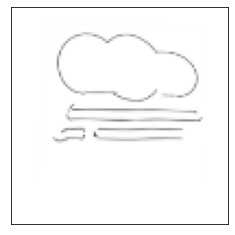

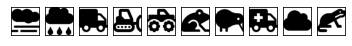

[[10.186736   5.675828   2.7112787 ...  0.         0.         7.0710173]
 [10.186736   5.675828   2.7112787 ...  0.         0.         7.0710173]
 [10.186736   5.675828   2.7112787 ...  0.         0.         7.0710173]
 ...
 [10.186736   5.675828   2.7112787 ...  0.         0.         7.0710173]
 [10.186736   5.675828   2.7112787 ...  0.         0.         7.0710173]
 [10.186736   5.675828   2.7112787 ...  0.         0.         7.0710173]]


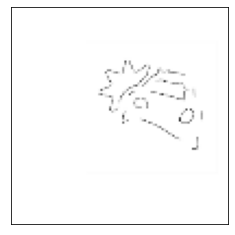

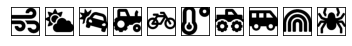

[[ 0.        0.        4.026934 ... 15.779702  0.        0.      ]
 [ 0.        0.        4.026934 ... 15.779702  0.        0.      ]
 [ 0.        0.        4.026934 ... 15.779702  0.        0.      ]
 ...
 [ 0.        0.        4.026934 ... 15.779702  0.        0.      ]
 [ 0.        0.        4.026934 ... 15.779702  0.        0.      ]
 [ 0.        0.        4.026934 ... 15.779702  0.        0.      ]]


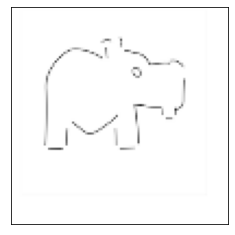

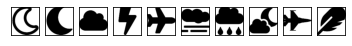

[[ 0.         0.         4.643098  ...  0.        17.737837   6.4448447]
 [ 0.         0.         4.643098  ...  0.        17.737837   6.4448447]
 [ 0.         0.         4.643098  ...  0.        17.737837   6.4448447]
 ...
 [ 0.         0.         4.643098  ...  0.        17.737837   6.4448447]
 [ 0.         0.         4.643098  ...  0.        17.737837   6.4448447]
 [ 0.         0.         4.643098  ...  0.        17.737837   6.4448447]]


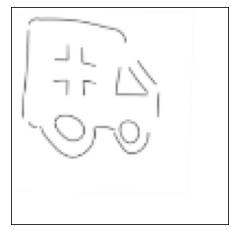

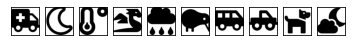

[[ 0.96243143  6.790325   16.120869   ...  0.          0.
   8.852737  ]
 [ 0.96243143  6.790325   16.120869   ...  0.          0.
   8.852737  ]
 [ 0.96243143  6.790325   16.120869   ...  0.          0.
   8.852737  ]
 ...
 [ 0.96243143  6.790325   16.120869   ...  0.          0.
   8.852737  ]
 [ 0.96243143  6.790325   16.120869   ...  0.          0.
   8.852737  ]
 [ 0.96243143  6.790325   16.120869   ...  0.          0.
   8.852737  ]]


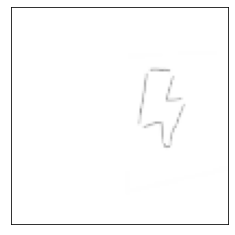

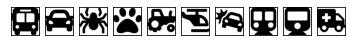

[[ 0.         0.         0.        ...  0.        29.504068   1.9826322]
 [ 0.         0.         0.        ...  0.        29.504068   1.9826322]
 [ 0.         0.         0.        ...  0.        29.504068   1.9826322]
 ...
 [ 0.         0.         0.        ...  0.        29.504068   1.9826322]
 [ 0.         0.         0.        ...  0.        29.504068   1.9826322]
 [ 0.         0.         0.        ...  0.        29.504068   1.9826322]]


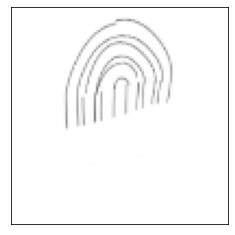

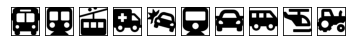

[[ 6.0301285  7.479727  10.120489  ...  0.         9.413457   2.9784653]
 [ 6.0301285  7.479727  10.120489  ...  0.         9.413457   2.9784653]
 [ 6.0301285  7.479727  10.120489  ...  0.         9.413457   2.9784653]
 ...
 [ 6.0301285  7.479727  10.120489  ...  0.         9.413457   2.9784653]
 [ 6.0301285  7.479727  10.120489  ...  0.         9.413457   2.9784653]
 [ 6.0301285  7.479727  10.120489  ...  0.         9.413457   2.9784653]]


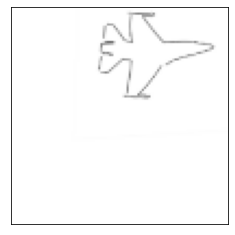

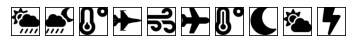

[[ 0.          1.1974646  11.771021   ...  0.          8.934581
   0.89742655]
 [ 0.          1.1974646  11.771021   ...  0.          8.934581
   0.89742655]
 [ 0.          1.1974646  11.771021   ...  0.          8.934581
   0.89742655]
 ...
 [ 0.          1.1974646  11.771021   ...  0.          8.934581
   0.89742655]
 [ 0.          1.1974646  11.771021   ...  0.          8.934581
   0.89742655]
 [ 0.          1.1974646  11.771021   ...  0.          8.934581
   0.89742655]]


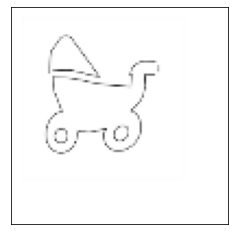

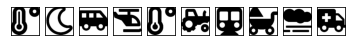

[[ 0.        11.213901   6.2797217 ...  0.        23.244474   9.199457 ]
 [ 0.        11.213901   6.2797217 ...  0.        23.244474   9.199457 ]
 [ 0.        11.213901   6.2797217 ...  0.        23.244474   9.199457 ]
 ...
 [ 0.        11.213901   6.2797217 ...  0.        23.244474   9.199457 ]
 [ 0.        11.213901   6.2797217 ...  0.        23.244474   9.199457 ]
 [ 0.        11.213901   6.2797217 ...  0.        23.244474   9.199457 ]]


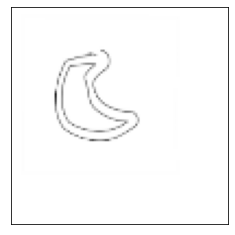

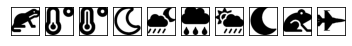

[[ 5.2216587 11.140189   3.235583  ... 23.79404    0.         8.363514 ]
 [ 5.2216587 11.140189   3.235583  ... 23.79404    0.         8.363514 ]
 [ 5.2216587 11.140189   3.235583  ... 23.79404    0.         8.363514 ]
 ...
 [ 5.2216587 11.140189   3.235583  ... 23.79404    0.         8.363514 ]
 [ 5.2216587 11.140189   3.235583  ... 23.79404    0.         8.363514 ]
 [ 5.2216587 11.140189   3.235583  ... 23.79404    0.         8.363514 ]]


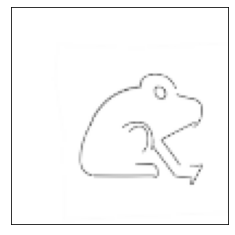

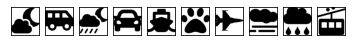

[[3.264085  1.0608526 9.317255  ... 0.        0.        0.       ]
 [3.264085  1.0608526 9.317255  ... 0.        0.        0.       ]
 [3.264085  1.0608526 9.317255  ... 0.        0.        0.       ]
 ...
 [3.264085  1.0608526 9.317255  ... 0.        0.        0.       ]
 [3.264085  1.0608526 9.317255  ... 0.        0.        0.       ]
 [3.264085  1.0608526 9.317255  ... 0.        0.        0.       ]]


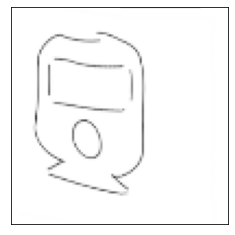

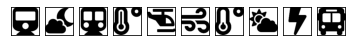

[[ 0.        0.        9.498264 ...  0.       13.178112 10.500465]
 [ 0.        0.        9.498264 ...  0.       13.178112 10.500465]
 [ 0.        0.        9.498264 ...  0.       13.178112 10.500465]
 ...
 [ 0.        0.        9.498264 ...  0.       13.178112 10.500465]
 [ 0.        0.        9.498264 ...  0.       13.178112 10.500465]
 [ 0.        0.        9.498264 ...  0.       13.178112 10.500465]]


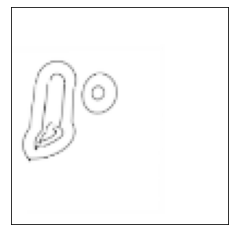

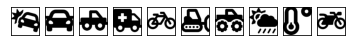

[[0.        0.        0.6447822 ... 0.        0.857507  2.4848228]
 [0.        0.        0.6447822 ... 0.        0.857507  2.4848228]
 [0.        0.        0.6447822 ... 0.        0.857507  2.4848228]
 ...
 [0.        0.        0.6447822 ... 0.        0.857507  2.4848228]
 [0.        0.        0.6447822 ... 0.        0.857507  2.4848228]
 [0.        0.        0.6447822 ... 0.        0.857507  2.4848228]]


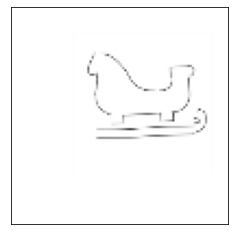

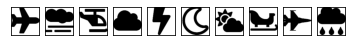

[[ 0.         0.         0.        ...  3.2371023 13.679491   0.       ]
 [ 0.         0.         0.        ...  3.2371023 13.679491   0.       ]
 [ 0.         0.         0.        ...  3.2371023 13.679491   0.       ]
 ...
 [ 0.         0.         0.        ...  3.2371023 13.679491   0.       ]
 [ 0.         0.         0.        ...  3.2371023 13.679491   0.       ]
 [ 0.         0.         0.        ...  3.2371023 13.679491   0.       ]]


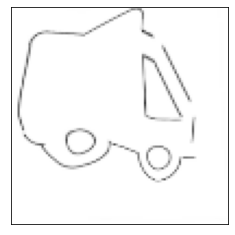

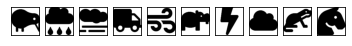

[[ 0.          0.23780765 11.771792   ...  0.         10.722809
   1.7317662 ]
 [ 0.          0.23780765 11.771792   ...  0.         10.722809
   1.7317662 ]
 [ 0.          0.23780765 11.771792   ...  0.         10.722809
   1.7317662 ]
 ...
 [ 0.          0.23780765 11.771792   ...  0.         10.722809
   1.7317662 ]
 [ 0.          0.23780765 11.771792   ...  0.         10.722809
   1.7317662 ]
 [ 0.          0.23780765 11.771792   ...  0.         10.722809
   1.7317662 ]]


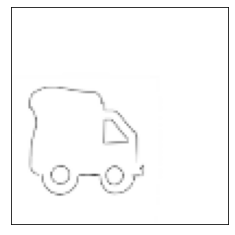

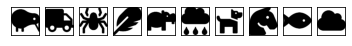

[[ 0.        0.        0.       ...  8.361113 28.928795 29.651627]
 [ 0.        0.        0.       ...  8.361113 28.928795 29.651627]
 [ 0.        0.        0.       ...  8.361113 28.928795 29.651627]
 ...
 [ 0.        0.        0.       ...  8.361113 28.928795 29.651627]
 [ 0.        0.        0.       ...  8.361113 28.928795 29.651627]
 [ 0.        0.        0.       ...  8.361113 28.928795 29.651627]]


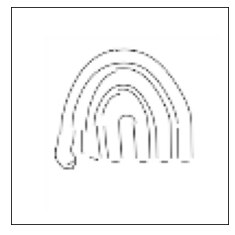

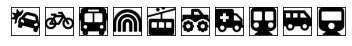

[[15.702846   0.         1.226801  ...  0.         9.167259   2.9468002]
 [15.702846   0.         1.226801  ...  0.         9.167259   2.9468002]
 [15.702846   0.         1.226801  ...  0.         9.167259   2.9468002]
 ...
 [15.702846   0.         1.226801  ...  0.         9.167259   2.9468002]
 [15.702846   0.         1.226801  ...  0.         9.167259   2.9468002]
 [15.702846   0.         1.226801  ...  0.         9.167259   2.9468002]]


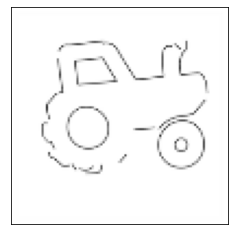

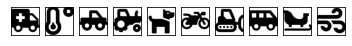

[[0.        7.559721  3.7914207 ... 0.        0.        0.       ]
 [0.        7.559721  3.7914207 ... 0.        0.        0.       ]
 [0.        7.559721  3.7914207 ... 0.        0.        0.       ]
 ...
 [0.        7.559721  3.7914207 ... 0.        0.        0.       ]
 [0.        7.559721  3.7914207 ... 0.        0.        0.       ]
 [0.        7.559721  3.7914207 ... 0.        0.        0.       ]]


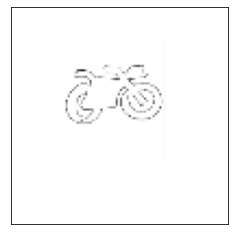

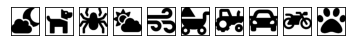

[[10.388728   0.267233   8.595329  ... 12.507747   5.5568247  4.367491 ]
 [10.388728   0.267233   8.595329  ... 12.507747   5.5568247  4.367491 ]
 [10.388728   0.267233   8.595329  ... 12.507747   5.5568247  4.367491 ]
 ...
 [10.388728   0.267233   8.595329  ... 12.507747   5.5568247  4.367491 ]
 [10.388728   0.267233   8.595329  ... 12.507747   5.5568247  4.367491 ]
 [10.388728   0.267233   8.595329  ... 12.507747   5.5568247  4.367491 ]]


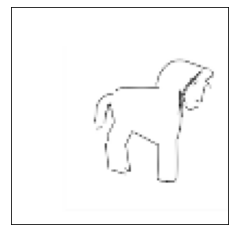

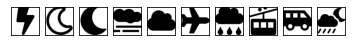

[[10.479449  19.528486  21.905586  ...  0.        26.070217   7.0145693]
 [10.479449  19.528486  21.905586  ...  0.        26.070217   7.0145693]
 [10.479449  19.528486  21.905586  ...  0.        26.070217   7.0145693]
 ...
 [10.479449  19.528486  21.905586  ...  0.        26.070217   7.0145693]
 [10.479449  19.528486  21.905586  ...  0.        26.070217   7.0145693]
 [10.479449  19.528486  21.905586  ...  0.        26.070217   7.0145693]]


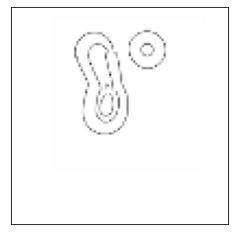

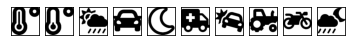

[[ 2.1276429  0.         0.        ...  5.195499  16.1189     0.       ]
 [ 2.1276429  0.         0.        ...  5.195499  16.1189     0.       ]
 [ 2.1276429  0.         0.        ...  5.195499  16.1189     0.       ]
 ...
 [ 2.1276429  0.         0.        ...  5.195499  16.1189     0.       ]
 [ 2.1276429  0.         0.        ...  5.195499  16.1189     0.       ]
 [ 2.1276429  0.         0.        ...  5.195499  16.1189     0.       ]]


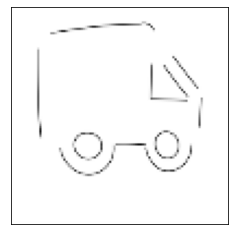

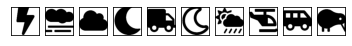

[[ 0.        20.855907   0.        ... 17.637632   0.         1.6606243]
 [ 0.        20.855907   0.        ... 17.637632   0.         1.6606243]
 [ 0.        20.855907   0.        ... 17.637632   0.         1.6606243]
 ...
 [ 0.        20.855907   0.        ... 17.637632   0.         1.6606243]
 [ 0.        20.855907   0.        ... 17.637632   0.         1.6606243]
 [ 0.        20.855907   0.        ... 17.637632   0.         1.6606243]]


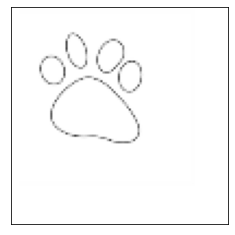

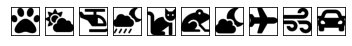

[[ 0.         7.679707  13.8953905 ...  0.         0.7493974  0.       ]
 [ 0.         7.679707  13.8953905 ...  0.         0.7493974  0.       ]
 [ 0.         7.679707  13.8953905 ...  0.         0.7493974  0.       ]
 ...
 [ 0.         7.679707  13.8953905 ...  0.         0.7493974  0.       ]
 [ 0.         7.679707  13.8953905 ...  0.         0.7493974  0.       ]
 [ 0.         7.679707  13.8953905 ...  0.         0.7493974  0.       ]]


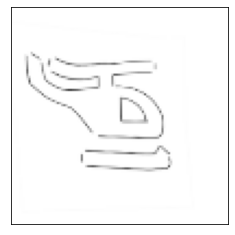

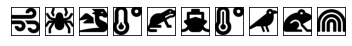

[[22.198061   8.82134   18.683388  ...  0.         4.2086315  2.3367176]
 [22.198061   8.82134   18.683388  ...  0.         4.2086315  2.3367176]
 [22.198061   8.82134   18.683388  ...  0.         4.2086315  2.3367176]
 ...
 [22.198061   8.82134   18.683388  ...  0.         4.2086315  2.3367176]
 [22.198061   8.82134   18.683388  ...  0.         4.2086315  2.3367176]
 [22.198061   8.82134   18.683388  ...  0.         4.2086315  2.3367176]]


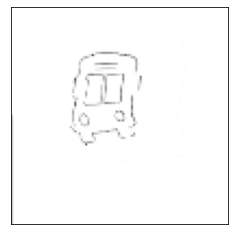

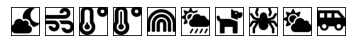

[[ 6.187038   9.523233   6.0849595 ...  4.996038   7.5314617 14.0828   ]
 [ 6.187038   9.523233   6.0849595 ...  4.996038   7.5314617 14.0828   ]
 [ 6.187038   9.523233   6.0849595 ...  4.996038   7.5314617 14.0828   ]
 ...
 [ 6.187038   9.523233   6.0849595 ...  4.996038   7.5314617 14.0828   ]
 [ 6.187038   9.523233   6.0849595 ...  4.996038   7.5314617 14.0828   ]
 [ 6.187038   9.523233   6.0849595 ...  4.996038   7.5314617 14.0828   ]]


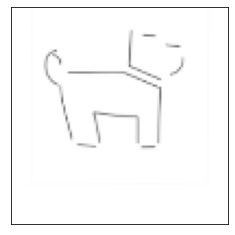

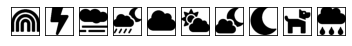

[[ 0.         3.8472977 11.536202  ...  4.7387314  6.8304396  0.       ]
 [ 0.         3.8472977 11.536202  ...  4.7387314  6.8304396  0.       ]
 [ 0.         3.8472977 11.536202  ...  4.7387314  6.8304396  0.       ]
 ...
 [ 0.         3.8472977 11.536202  ...  4.7387314  6.8304396  0.       ]
 [ 0.         3.8472977 11.536202  ...  4.7387314  6.8304396  0.       ]
 [ 0.         3.8472977 11.536202  ...  4.7387314  6.8304396  0.       ]]


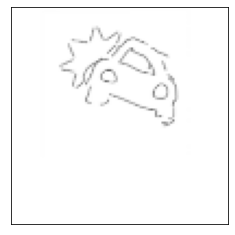

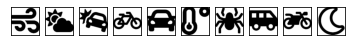

[[ 2.1427157 26.072426   9.485946  ...  0.         0.         0.       ]
 [ 2.1427157 26.072426   9.485946  ...  0.         0.         0.       ]
 [ 2.1427157 26.072426   9.485946  ...  0.         0.         0.       ]
 ...
 [ 2.1427157 26.072426   9.485946  ...  0.         0.         0.       ]
 [ 2.1427157 26.072426   9.485946  ...  0.         0.         0.       ]
 [ 2.1427157 26.072426   9.485946  ...  0.         0.         0.       ]]


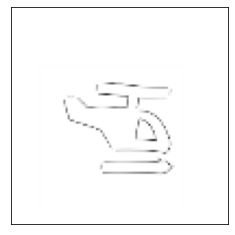

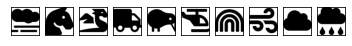

[[ 2.6238062 11.157691  10.609776  ... 14.721045  20.692896  11.083605 ]
 [ 2.6238062 11.157691  10.609776  ... 14.721045  20.692896  11.083605 ]
 [ 2.6238062 11.157691  10.609776  ... 14.721045  20.692896  11.083605 ]
 ...
 [ 2.6238062 11.157691  10.609776  ... 14.721045  20.692896  11.083605 ]
 [ 2.6238062 11.157691  10.609776  ... 14.721045  20.692896  11.083605 ]
 [ 2.6238062 11.157691  10.609776  ... 14.721045  20.692896  11.083605 ]]


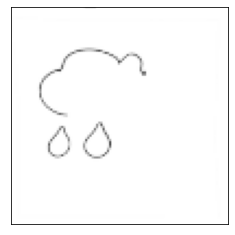

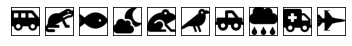

[[0.        0.        0.        ... 6.8612666 5.576411  0.       ]
 [0.        0.        0.        ... 6.8612666 5.576411  0.       ]
 [0.        0.        0.        ... 6.8612666 5.576411  0.       ]
 ...
 [0.        0.        0.        ... 6.8612666 5.576411  0.       ]
 [0.        0.        0.        ... 6.8612666 5.576411  0.       ]
 [0.        0.        0.        ... 6.8612666 5.576411  0.       ]]


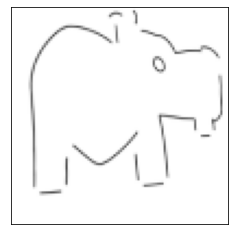

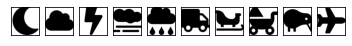

[[ 0.       12.780915  0.       ...  9.141686  0.        0.      ]
 [ 0.       12.780915  0.       ...  9.141686  0.        0.      ]
 [ 0.       12.780915  0.       ...  9.141686  0.        0.      ]
 ...
 [ 0.       12.780915  0.       ...  9.141686  0.        0.      ]
 [ 0.       12.780915  0.       ...  9.141686  0.        0.      ]
 [ 0.       12.780915  0.       ...  9.141686  0.        0.      ]]


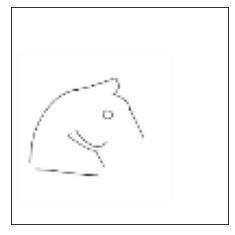

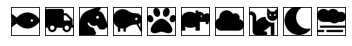

[[17.333002   7.4317274 14.470075  ...  3.1231115  0.         0.       ]
 [17.333002   7.4317274 14.470075  ...  3.1231115  0.         0.       ]
 [17.333002   7.4317274 14.470075  ...  3.1231115  0.         0.       ]
 ...
 [17.333002   7.4317274 14.470075  ...  3.1231115  0.         0.       ]
 [17.333002   7.4317274 14.470075  ...  3.1231115  0.         0.       ]
 [17.333002   7.4317274 14.470075  ...  3.1231115  0.         0.       ]]


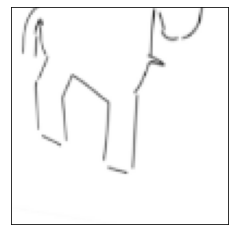

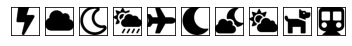

[[ 2.9795191 10.196515  11.752552  ...  8.907104   3.3731914 25.772425 ]
 [ 2.9795191 10.196515  11.752552  ...  8.907104   3.3731914 25.772425 ]
 [ 2.9795191 10.196515  11.752552  ...  8.907104   3.3731914 25.772425 ]
 ...
 [ 2.9795191 10.196515  11.752552  ...  8.907104   3.3731914 25.772425 ]
 [ 2.9795191 10.196515  11.752552  ...  8.907104   3.3731914 25.772425 ]
 [ 2.9795191 10.196515  11.752552  ...  8.907104   3.3731914 25.772425 ]]


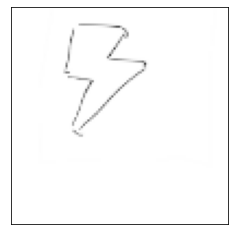

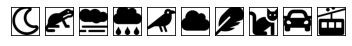

[[ 0.         0.         6.86282   ... 29.155638   0.        11.7302265]
 [ 0.         0.         6.86282   ... 29.155638   0.        11.7302265]
 [ 0.         0.         6.86282   ... 29.155638   0.        11.7302265]
 ...
 [ 0.         0.         6.86282   ... 29.155638   0.        11.7302265]
 [ 0.         0.         6.86282   ... 29.155638   0.        11.7302265]
 [ 0.         0.         6.86282   ... 29.155638   0.        11.7302265]]


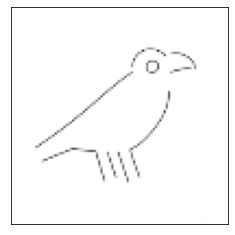

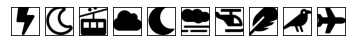

[[ 0.76178354  1.5335171  12.618198   ...  0.          0.
   1.3664103 ]
 [ 0.76178354  1.5335171  12.618198   ...  0.          0.
   1.3664103 ]
 [ 0.76178354  1.5335171  12.618198   ...  0.          0.
   1.3664103 ]
 ...
 [ 0.76178354  1.5335171  12.618198   ...  0.          0.
   1.3664103 ]
 [ 0.76178354  1.5335171  12.618198   ...  0.          0.
   1.3664103 ]
 [ 0.76178354  1.5335171  12.618198   ...  0.          0.
   1.3664103 ]]


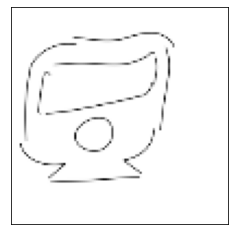

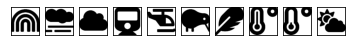

[[ 0.         2.7516415  0.        ...  0.        16.768515   0.       ]
 [ 0.         2.7516415  0.        ...  0.        16.768515   0.       ]
 [ 0.         2.7516415  0.        ...  0.        16.768515   0.       ]
 ...
 [ 0.         2.7516415  0.        ...  0.        16.768515   0.       ]
 [ 0.         2.7516415  0.        ...  0.        16.768515   0.       ]
 [ 0.         2.7516415  0.        ...  0.        16.768515   0.       ]]


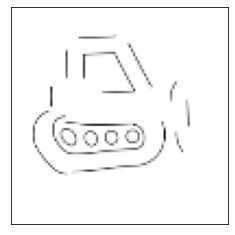

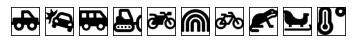

[[0.        6.009612  6.934263  ... 4.48442   1.6435403 1.0571864]
 [0.        6.009612  6.934263  ... 4.48442   1.6435403 1.0571864]
 [0.        6.009612  6.934263  ... 4.48442   1.6435403 1.0571864]
 ...
 [0.        6.009612  6.934263  ... 4.48442   1.6435403 1.0571864]
 [0.        6.009612  6.934263  ... 4.48442   1.6435403 1.0571864]
 [0.        6.009612  6.934263  ... 4.48442   1.6435403 1.0571864]]


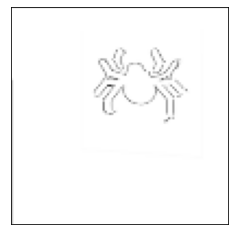

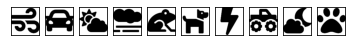

[[0.        0.        5.887324  ... 1.2205025 5.1862335 9.758784 ]
 [0.        0.        5.887324  ... 1.2205025 5.1862335 9.758784 ]
 [0.        0.        5.887324  ... 1.2205025 5.1862335 9.758784 ]
 ...
 [0.        0.        5.887324  ... 1.2205025 5.1862335 9.758784 ]
 [0.        0.        5.887324  ... 1.2205025 5.1862335 9.758784 ]
 [0.        0.        5.887324  ... 1.2205025 5.1862335 9.758784 ]]


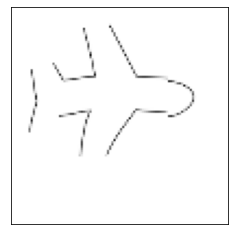

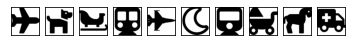

[[ 0.         8.075618   0.9206401 ... 23.314154   0.         9.841537 ]
 [ 0.         8.075618   0.9206401 ... 23.314154   0.         9.841537 ]
 [ 0.         8.075618   0.9206401 ... 23.314154   0.         9.841537 ]
 ...
 [ 0.         8.075618   0.9206401 ... 23.314154   0.         9.841537 ]
 [ 0.         8.075618   0.9206401 ... 23.314154   0.         9.841537 ]
 [ 0.         8.075618   0.9206401 ... 23.314154   0.         9.841537 ]]


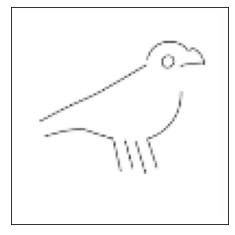

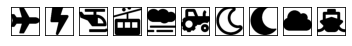

[[ 7.3864737  4.237279   6.9620967 ... 10.019887  22.35499   29.807991 ]
 [ 7.3864737  4.237279   6.9620967 ... 10.019887  22.35499   29.807991 ]
 [ 7.3864737  4.237279   6.9620967 ... 10.019887  22.35499   29.807991 ]
 ...
 [ 7.3864737  4.237279   6.9620967 ... 10.019887  22.35499   29.807991 ]
 [ 7.3864737  4.237279   6.9620967 ... 10.019887  22.35499   29.807991 ]
 [ 7.3864737  4.237279   6.9620967 ... 10.019887  22.35499   29.807991 ]]


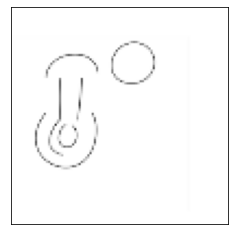

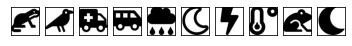

[[ 0.       12.757245  0.       ... 14.063128  0.        0.      ]
 [ 0.       12.757245  0.       ... 14.063128  0.        0.      ]
 [ 0.       12.757245  0.       ... 14.063128  0.        0.      ]
 ...
 [ 0.       12.757245  0.       ... 14.063128  0.        0.      ]
 [ 0.       12.757245  0.       ... 14.063128  0.        0.      ]
 [ 0.       12.757245  0.       ... 14.063128  0.        0.      ]]


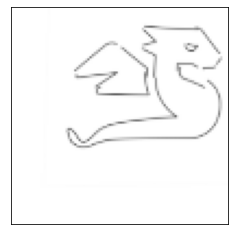

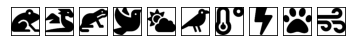

[[ 0.       32.41466   8.874452 ...  0.       19.579391 12.572037]
 [ 0.       32.41466   8.874452 ...  0.       19.579391 12.572037]
 [ 0.       32.41466   8.874452 ...  0.       19.579391 12.572037]
 ...
 [ 0.       32.41466   8.874452 ...  0.       19.579391 12.572037]
 [ 0.       32.41466   8.874452 ...  0.       19.579391 12.572037]
 [ 0.       32.41466   8.874452 ...  0.       19.579391 12.572037]]


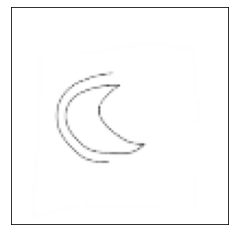

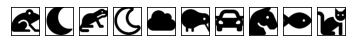

[[ 0.         7.792725   0.        ...  2.1416857  3.087097  10.57205  ]
 [ 0.         7.792725   0.        ...  2.1416857  3.087097  10.57205  ]
 [ 0.         7.792725   0.        ...  2.1416857  3.087097  10.57205  ]
 ...
 [ 0.         7.792725   0.        ...  2.1416857  3.087097  10.57205  ]
 [ 0.         7.792725   0.        ...  2.1416857  3.087097  10.57205  ]
 [ 0.         7.792725   0.        ...  2.1416857  3.087097  10.57205  ]]


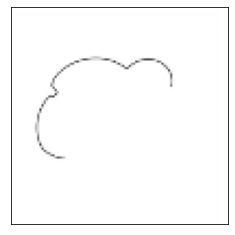

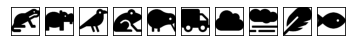

[[ 0.         0.         0.        ... 12.25704    1.0805343  0.6373128]
 [ 0.         0.         0.        ... 12.25704    1.0805343  0.6373128]
 [ 0.         0.         0.        ... 12.25704    1.0805343  0.6373128]
 ...
 [ 0.         0.         0.        ... 12.25704    1.0805343  0.6373128]
 [ 0.         0.         0.        ... 12.25704    1.0805343  0.6373128]
 [ 0.         0.         0.        ... 12.25704    1.0805343  0.6373128]]


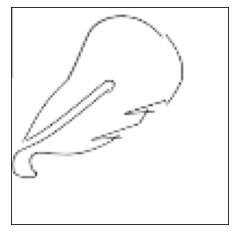

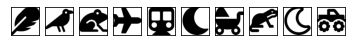

[[ 0.         7.6605225 12.405764  ... 18.647009   0.         1.637569 ]
 [ 0.         7.6605225 12.405764  ... 18.647009   0.         1.637569 ]
 [ 0.         7.6605225 12.405764  ... 18.647009   0.         1.637569 ]
 ...
 [ 0.         7.6605225 12.405764  ... 18.647009   0.         1.637569 ]
 [ 0.         7.6605225 12.405764  ... 18.647009   0.         1.637569 ]
 [ 0.         7.6605225 12.405764  ... 18.647009   0.         1.637569 ]]


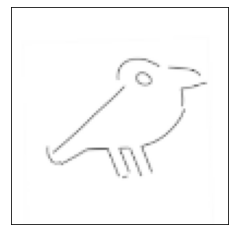

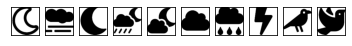

[[0.         0.         0.27070725 ... 0.         4.3923683  0.23303005]
 [0.         0.         0.27070725 ... 0.         4.3923683  0.23303005]
 [0.         0.         0.27070725 ... 0.         4.3923683  0.23303005]
 ...
 [0.         0.         0.27070725 ... 0.         4.3923683  0.23303005]
 [0.         0.         0.27070725 ... 0.         4.3923683  0.23303005]
 [0.         0.         0.27070725 ... 0.         4.3923683  0.23303005]]


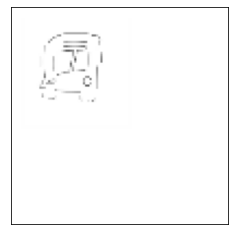

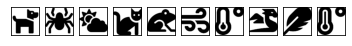

[[0.        6.024247  0.        ... 0.        6.9553337 0.       ]
 [0.        6.024247  0.        ... 0.        6.9553337 0.       ]
 [0.        6.024247  0.        ... 0.        6.9553337 0.       ]
 ...
 [0.        6.024247  0.        ... 0.        6.9553337 0.       ]
 [0.        6.024247  0.        ... 0.        6.9553337 0.       ]
 [0.        6.024247  0.        ... 0.        6.9553337 0.       ]]


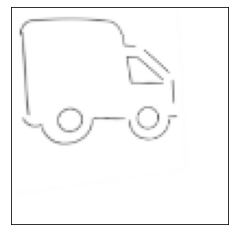

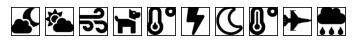

[[0.        0.        1.6975394 ... 0.        1.9245048 0.       ]
 [0.        0.        1.6975394 ... 0.        1.9245048 0.       ]
 [0.        0.        1.6975394 ... 0.        1.9245048 0.       ]
 ...
 [0.        0.        1.6975394 ... 0.        1.9245048 0.       ]
 [0.        0.        1.6975394 ... 0.        1.9245048 0.       ]
 [0.        0.        1.6975394 ... 0.        1.9245048 0.       ]]


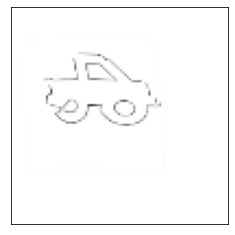

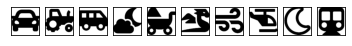

[[ 5.6229053  3.9929664  5.6098714 ...  8.195567   6.825098  19.573662 ]
 [ 5.6229053  3.9929664  5.6098714 ...  8.195567   6.825098  19.573662 ]
 [ 5.6229053  3.9929664  5.6098714 ...  8.195567   6.825098  19.573662 ]
 ...
 [ 5.6229053  3.9929664  5.6098714 ...  8.195567   6.825098  19.573662 ]
 [ 5.6229053  3.9929664  5.6098714 ...  8.195567   6.825098  19.573662 ]
 [ 5.6229053  3.9929664  5.6098714 ...  8.195567   6.825098  19.573662 ]]


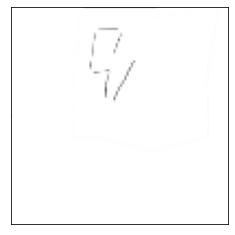

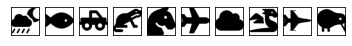

[[9.68833   0.        5.926934  ... 8.894349  4.6863446 0.       ]
 [9.68833   0.        5.926934  ... 8.894349  4.6863446 0.       ]
 [9.68833   0.        5.926934  ... 8.894349  4.6863446 0.       ]
 ...
 [9.68833   0.        5.926934  ... 8.894349  4.6863446 0.       ]
 [9.68833   0.        5.926934  ... 8.894349  4.6863446 0.       ]
 [9.68833   0.        5.926934  ... 8.894349  4.6863446 0.       ]]


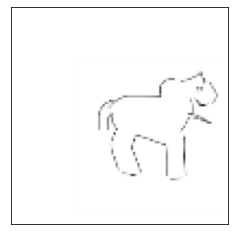

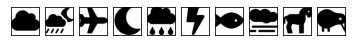

[[ 0.         4.9122257 10.224407  ...  2.5274918  1.7080741  6.7189713]
 [ 0.         4.9122257 10.224407  ...  2.5274918  1.7080741  6.7189713]
 [ 0.         4.9122257 10.224407  ...  2.5274918  1.7080741  6.7189713]
 ...
 [ 0.         4.9122257 10.224407  ...  2.5274918  1.7080741  6.7189713]
 [ 0.         4.9122257 10.224407  ...  2.5274918  1.7080741  6.7189713]
 [ 0.         4.9122257 10.224407  ...  2.5274918  1.7080741  6.7189713]]


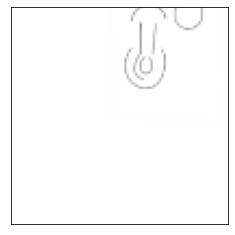

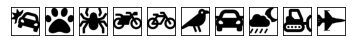

[[ 0.69600844  5.8340325   4.394104   ...  0.         12.124511
  11.45233   ]
 [ 0.69600844  5.8340325   4.394104   ...  0.         12.124511
  11.45233   ]
 [ 0.69600844  5.8340325   4.394104   ...  0.         12.124511
  11.45233   ]
 ...
 [ 0.69600844  5.8340325   4.394104   ...  0.         12.124511
  11.45233   ]
 [ 0.69600844  5.8340325   4.394104   ...  0.         12.124511
  11.45233   ]
 [ 0.69600844  5.8340325   4.394104   ...  0.         12.124511
  11.45233   ]]


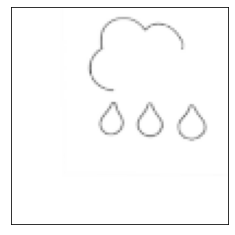

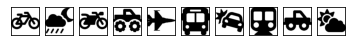

[[ 0.         7.7844415  2.6897588 ...  1.9952686 10.448646  22.569841 ]
 [ 0.         7.7844415  2.6897588 ...  1.9952686 10.448646  22.569841 ]
 [ 0.         7.7844415  2.6897588 ...  1.9952686 10.448646  22.569841 ]
 ...
 [ 0.         7.7844415  2.6897588 ...  1.9952686 10.448646  22.569841 ]
 [ 0.         7.7844415  2.6897588 ...  1.9952686 10.448646  22.569841 ]
 [ 0.         7.7844415  2.6897588 ...  1.9952686 10.448646  22.569841 ]]


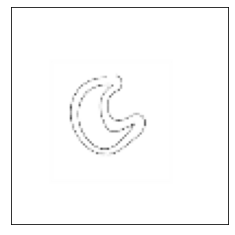

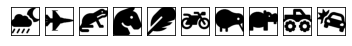

[[ 0.         4.1085987 11.812204  ...  0.         6.3136373  5.4933457]
 [ 0.         4.1085987 11.812204  ...  0.         6.3136373  5.4933457]
 [ 0.         4.1085987 11.812204  ...  0.         6.3136373  5.4933457]
 ...
 [ 0.         4.1085987 11.812204  ...  0.         6.3136373  5.4933457]
 [ 0.         4.1085987 11.812204  ...  0.         6.3136373  5.4933457]
 [ 0.         4.1085987 11.812204  ...  0.         6.3136373  5.4933457]]


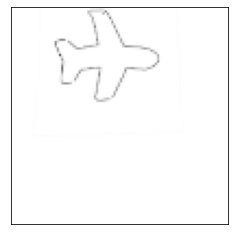

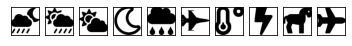

[[ 1.3031347  5.2786975  0.        ... 15.320701   0.        19.649832 ]
 [ 1.3031347  5.2786975  0.        ... 15.320701   0.        19.649832 ]
 [ 1.3031347  5.2786975  0.        ... 15.320701   0.        19.649832 ]
 ...
 [ 1.3031347  5.2786975  0.        ... 15.320701   0.        19.649832 ]
 [ 1.3031347  5.2786975  0.        ... 15.320701   0.        19.649832 ]
 [ 1.3031347  5.2786975  0.        ... 15.320701   0.        19.649832 ]]


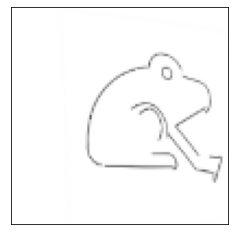

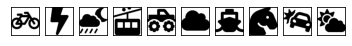

[[ 0.        22.530077   7.5797796 ...  0.        11.22838   14.556097 ]
 [ 0.        22.530077   7.5797796 ...  0.        11.22838   14.556097 ]
 [ 0.        22.530077   7.5797796 ...  0.        11.22838   14.556097 ]
 ...
 [ 0.        22.530077   7.5797796 ...  0.        11.22838   14.556097 ]
 [ 0.        22.530077   7.5797796 ...  0.        11.22838   14.556097 ]
 [ 0.        22.530077   7.5797796 ...  0.        11.22838   14.556097 ]]


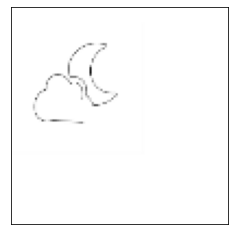

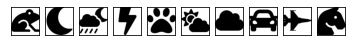

[[0.       0.       9.161924 ... 0.       0.       0.      ]
 [0.       0.       9.161924 ... 0.       0.       0.      ]
 [0.       0.       9.161924 ... 0.       0.       0.      ]
 ...
 [0.       0.       9.161924 ... 0.       0.       0.      ]
 [0.       0.       9.161924 ... 0.       0.       0.      ]
 [0.       0.       9.161924 ... 0.       0.       0.      ]]


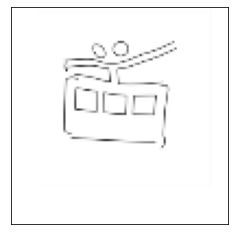

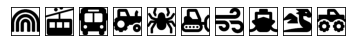

[[ 1.6872267  16.439037    3.1913838  ...  0.85739464 19.251276
   0.        ]
 [ 1.6872267  16.439037    3.1913838  ...  0.85739464 19.251276
   0.        ]
 [ 1.6872267  16.439037    3.1913838  ...  0.85739464 19.251276
   0.        ]
 ...
 [ 1.6872267  16.439037    3.1913838  ...  0.85739464 19.251276
   0.        ]
 [ 1.6872267  16.439037    3.1913838  ...  0.85739464 19.251276
   0.        ]
 [ 1.6872267  16.439037    3.1913838  ...  0.85739464 19.251276
   0.        ]]


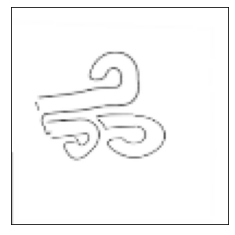

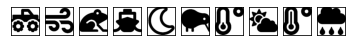

[[ 0.       11.282304  4.091192 ... 15.798136  0.       21.18073 ]
 [ 0.       11.282304  4.091192 ... 15.798136  0.       21.18073 ]
 [ 0.       11.282304  4.091192 ... 15.798136  0.       21.18073 ]
 ...
 [ 0.       11.282304  4.091192 ... 15.798136  0.       21.18073 ]
 [ 0.       11.282304  4.091192 ... 15.798136  0.       21.18073 ]
 [ 0.       11.282304  4.091192 ... 15.798136  0.       21.18073 ]]


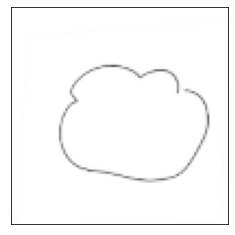

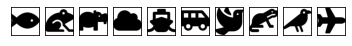

[[0.        0.        1.4215878 ... 0.        0.        0.       ]
 [0.        0.        1.4215878 ... 0.        0.        0.       ]
 [0.        0.        1.4215878 ... 0.        0.        0.       ]
 ...
 [0.        0.        1.4215878 ... 0.        0.        0.       ]
 [0.        0.        1.4215878 ... 0.        0.        0.       ]
 [0.        0.        1.4215878 ... 0.        0.        0.       ]]


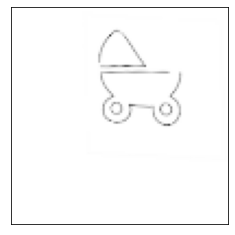

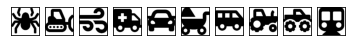

[[ 4.229025  11.678536   4.185268  ...  8.83361    0.8283955  5.303631 ]
 [ 4.229025  11.678536   4.185268  ...  8.83361    0.8283955  5.303631 ]
 [ 4.229025  11.678536   4.185268  ...  8.83361    0.8283955  5.303631 ]
 ...
 [ 4.229025  11.678536   4.185268  ...  8.83361    0.8283955  5.303631 ]
 [ 4.229025  11.678536   4.185268  ...  8.83361    0.8283955  5.303631 ]
 [ 4.229025  11.678536   4.185268  ...  8.83361    0.8283955  5.303631 ]]


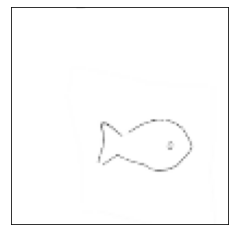

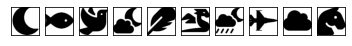

[[ 5.496653  10.239853  13.536217  ...  0.         4.2147055  4.0907955]
 [ 5.496653  10.239853  13.536217  ...  0.         4.2147055  4.0907955]
 [ 5.496653  10.239853  13.536217  ...  0.         4.2147055  4.0907955]
 ...
 [ 5.496653  10.239853  13.536217  ...  0.         4.2147055  4.0907955]
 [ 5.496653  10.239853  13.536217  ...  0.         4.2147055  4.0907955]
 [ 5.496653  10.239853  13.536217  ...  0.         4.2147055  4.0907955]]


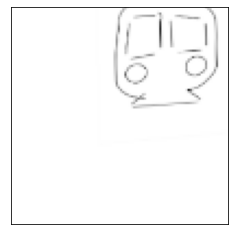

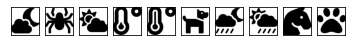

[[ 6.5766335 12.479947   6.7641306 ...  0.         0.         0.672823 ]
 [ 6.5766335 12.479947   6.7641306 ...  0.         0.         0.672823 ]
 [ 6.5766335 12.479947   6.7641306 ...  0.         0.         0.672823 ]
 ...
 [ 6.5766335 12.479947   6.7641306 ...  0.         0.         0.672823 ]
 [ 6.5766335 12.479947   6.7641306 ...  0.         0.         0.672823 ]
 [ 6.5766335 12.479947   6.7641306 ...  0.         0.         0.672823 ]]


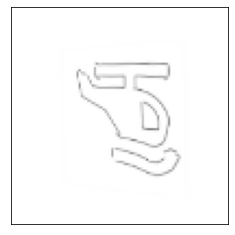

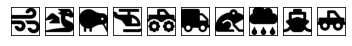

[[ 0.         6.9514246  1.8650783 ... 20.724007   0.        13.066839 ]
 [ 0.         6.9514246  1.8650783 ... 20.724007   0.        13.066839 ]
 [ 0.         6.9514246  1.8650783 ... 20.724007   0.        13.066839 ]
 ...
 [ 0.         6.9514246  1.8650783 ... 20.724007   0.        13.066839 ]
 [ 0.         6.9514246  1.8650783 ... 20.724007   0.        13.066839 ]
 [ 0.         6.9514246  1.8650783 ... 20.724007   0.        13.066839 ]]


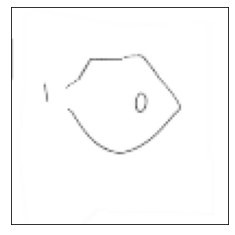

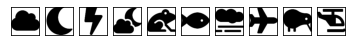

[[ 0.        14.7189455 17.00285   ...  0.         0.         4.258089 ]
 [ 0.        14.7189455 17.00285   ...  0.         0.         4.258089 ]
 [ 0.        14.7189455 17.00285   ...  0.         0.         4.258089 ]
 ...
 [ 0.        14.7189455 17.00285   ...  0.         0.         4.258089 ]
 [ 0.        14.7189455 17.00285   ...  0.         0.         4.258089 ]
 [ 0.        14.7189455 17.00285   ...  0.         0.         4.258089 ]]


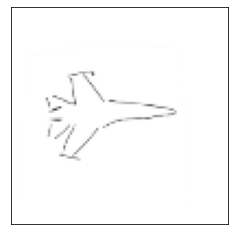

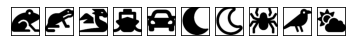

[[ 0.        16.936556   0.        ...  0.         3.4803941  0.       ]
 [ 0.        16.936556   0.        ...  0.         3.4803941  0.       ]
 [ 0.        16.936556   0.        ...  0.         3.4803941  0.       ]
 ...
 [ 0.        16.936556   0.        ...  0.         3.4803941  0.       ]
 [ 0.        16.936556   0.        ...  0.         3.4803941  0.       ]
 [ 0.        16.936556   0.        ...  0.         3.4803941  0.       ]]


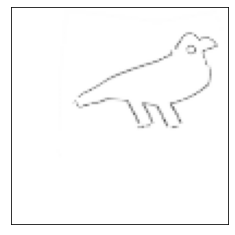

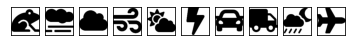

[[ 2.752845  18.290356  11.540667  ...  3.1697729 15.083548  20.775812 ]
 [ 2.752845  18.290356  11.540667  ...  3.1697729 15.083548  20.775812 ]
 [ 2.752845  18.290356  11.540667  ...  3.1697729 15.083548  20.775812 ]
 ...
 [ 2.752845  18.290356  11.540667  ...  3.1697729 15.083548  20.775812 ]
 [ 2.752845  18.290356  11.540667  ...  3.1697729 15.083548  20.775812 ]
 [ 2.752845  18.290356  11.540667  ...  3.1697729 15.083548  20.775812 ]]


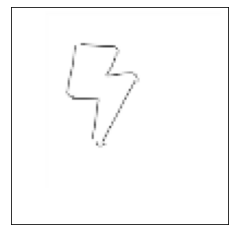

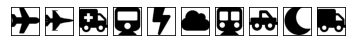

Accuracy of top 1: 0.08783783783783784
Accuracy of top 10: 0.6621621621621622


In [10]:
if epoch%1==0:
    acc_1 = 0
    acc_10 = 0
    sketch_representations = []
    for j in range(0, len(sketches_Test), BATCH_SIZE):
        batch_sketches = sketches_Test[j:j+BATCH_SIZE]
        sketches_array = get_batch_sketches(batch_sketches)
        sketch_repr =  sketchClassificationModel(sketches_array, training = False)
        sketch_representations.append(sketch_repr)
    sketch_representations = np.vstack(sketch_representations)
    
    icon_representations = []
    for j in range(0, len(unique_icons_Test), BATCH_SIZE):
        batch_icons = unique_icons_Test[j:j+BATCH_SIZE]
        icons_array = get_batch_icons(batch_icons)
        icons_repr =  iconClassificationModel(icons_array, training = False)
        icon_representations.append(icons_repr)

    icon_representations = np.vstack(icon_representations)

    for k in range(len(sketch_representations)):
        sketch_repr = sketch_representations[k]
        sketch_representations_tile = np.tile(sketch_repr, len(unique_icons_Test)).reshape(len(unique_icons_Test), 64)
        diff = np.sqrt(np.mean((sketch_representations_tile - icon_representations)**2, -1))
        top_k = np.argsort(diff)[:10]
        print(sketch_representations_tile)
        img = sketch_dictionary[sketches_Test[k][0]]
        plt.imshow(img)
        plt.xticks([])
        plt.yticks([])
        plt.show()
        
        
        for j in range(len(top_k)):
            index = top_k[j]
            if j == 0 and sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                acc_1 = acc_1 + 1
                acc_10 = acc_10 + 1
                #break
            elif sketches_Test[k][0].split("_")[0] == unique_icons_Test[index][0].replace(".jpg",""):
                acc_10 = acc_10 + 1
                #break
            img = icon_dictionary[unique_icons_Test[index][0]]
            plt.subplot(1, 10, j+1)
            plt.imshow(img)
            plt.xticks([])
            plt.yticks([])
        plt.show()     
    print("Accuracy of top 1: " + str(acc_1/len(sketches_Test)))
    print("Accuracy of top 10: " + str(acc_10/len(sketches_Test)))

            

[['wind_9.png' 'weather' 'wind.jpg' 'weather' 'moon.jpg' 'weather']
 ['spider_24.png' 'animals' 'spider.jpg' 'animals' 'horse-head.jpg'
  'animals']
 ['truck-monster_23.png' 'vehicles' 'truck-monster.jpg' 'vehicles'
  'bicycle.jpg' 'vehicles']
 ...
 ['ship_10.png' 'vehicles' 'ship.jpg' 'vehicles' 'bus.jpg' 'vehicles']
 ['motorcycle_8.png' 'vehicles' 'motorcycle.jpg' 'vehicles'
  'helicopter.jpg' 'vehicles']
 ['shuttle-van_16.png' 'vehicles' 'shuttle-van.jpg' 'vehicles' 'car.jpg'
  'vehicles']]
